# Classification and statistics on TripAdvisor reviews
For this project, we will consider the dataset collected by the team of Dr. Rafael Guerrero, professor in the Division of Economic and Administrative Sciences at the University of Guanajuato. This dataset contains approximately ten thousand tourist reviews on TripAdvisor for 10 tourist sites in the city of Guanajuato. The objective is to carry out the following activities and answer the questions.

In [19]:
#Tools
import os
import time
import shutil
import random
from typing import Tuple #Tiping es una libreria que permite definir tipos de variables
from argparse import Namespace #Permite definir argumentos de entrada
import matplotlib.pyplot as plt
import seaborn as sns

#Prepocessing
import nltk
from nltk.corpus import stopwords
from nltk import ngrams
import numpy as np
from nltk import FreqDist
import pandas as pd
from nltk.tokenize import TweetTokenizer


#Pythorch
from torch.utils.data import DataLoader,TensorDataset
import torch
import torch.nn as nn
import torch.nn.functional as F

#scikit-learn
from sklearn.metrics import accuracy_score,confusion_matrix,f1_score,precision_recall_fscore_support
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_selection import SelectKBest,chi2 #esta se tiene que cambiar por una a mano
from sklearn.manifold import TSNE



#Importar librerias de sklearn
from sklearn import svm 
from sklearn.svm import LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn import metrics 


from IPython.display import display

In [2]:
from nltk.corpus import stopwords

from nltk.tokenize import TweetTokenizer
from nltk import FreqDist

In [3]:
seed=1111
random.seed(seed) #phyton seed
np.random.seed(seed) #numpy seed
torch.manual_seed(seed) #torch seed
torch.backends.cudnn.deterministic = False #Se refiere a la implementacion de cudnn, que es la libreria de pytorch que permite hacer calculos en la GPU, False para que no sea determinista

Para cargar los datos utilice Pandas

In [ ]:
df_alhondiga = pd.read_csv('opiniones/Alhóndiga 930.csv', encoding='utf-8') 
df_basilica = pd.read_csv('opiniones/Basilica Colegiata 560.csv', encoding='utf-8') 
df_callejondelbeso = pd.read_csv('opiniones/Callejón del Beso 1,360.csv', encoding='utf-8') 
df_diegoR = pd.read_csv('opiniones/Casa de Diego Rivera 698.csv', encoding='utf-8') 
df_jardinU = pd.read_csv('opiniones/Jardín de la Unión 1,134.csv', encoding='utf-8') 
df_mercado = pd.read_csv('opiniones/Mercado Hidalgo 600.csv', encoding='utf-8') 
df_pipila = pd.read_csv('opiniones/Monumento Pípila 1,620.csv', encoding='utf-8') 
df_momias = pd.read_csv('opiniones/Museo de las Momias 1,650.csv', encoding='utf-8') 
df_juarez = pd.read_csv('opiniones/Teatro Juárez 1,010.csv', encoding='utf-8') 
df_ug = pd.read_csv('opiniones/Universidad de Guanajuato 900.csv', encoding='utf-8') 

# 1.
Construya estadísticas básicas respecto a la opinión de cada lugar turístico. Pre-procese y limpie el texto según sus intuiciones y argumente brevemente sobre ello.

Considere scores de 4 a 5 como positivos, calificaciones de 3 como neutros y las de 2 a 1 como negativos. Es interesante ver:
- Promedios de calificación por lugar, y desviaciones estándar en los scores
- Basado en palabras: longitud promedio de opiniones y desviaciones estándar
- Histogramas de edades de opiniones por lugar
- Histograma de tipo de visitantes (nacional o internacional) por lugar
- Sugiere dos más interesantes para ti

In [5]:
class EstadisticasOpiniones:
    calificacion_map = {
        'Excelente': 5, 'Muy bueno': 4,
        'Regular': 3, 'Malo': 2, 'Pésimo': 1
    }

    def __init__(self, dataframe, nombre_lugar="Lugar"):
        self.df = dataframe.copy()
        self.nombre_lugar = nombre_lugar
        self._preparar_datos()

    def _preparar_datos(self):
        self.df['Calificación_num'] = self.df['Calificación'].map(self.calificacion_map)
        self.df['Tipo_score'] = self.df['Calificación'].apply(self._scores_calificacion)
        self.df['Longitud_opinion'] = self.df['Opinión'].str.split().str.len()

    def _scores_calificacion(self, calificacion):
        if calificacion in ['Excelente', 'Muy bueno']:
            return 'Positivo'
        elif calificacion == 'Regular':
            return 'Neutro'
        else:
            return 'Negativo'

    def imprimir_estadisticas_calificacion(self):
        stats_calificacion = self.df['Calificación_num'].agg(['mean', 'std']).reset_index()
        print(f"\nEstadísticas de calificación en {self.nombre_lugar}:")
        print(stats_calificacion)

    def imprimir_estadisticas_opinion(self):
        stats_opinion = self.df['Longitud_opinion'].agg(['mean', 'std']).reset_index()
        print(f"\nEstadísticas de longitud de opinión en {self.nombre_lugar}:")
        print(stats_opinion)

    def histograma_edades(self):
        sns.set(style='whitegrid', palette=self._rosa_palette())
        plt.figure(figsize=(12,8))
        sns.histplot(data=self.df, x='Edad', multiple='stack', kde=True, bins=10)
        plt.title(f'Distribución de Edad - {self.nombre_lugar}')
        plt.xlabel('Edad')
        plt.ylabel('Cantidad de Opiniones')
        plt.tight_layout()
        plt.show()

    def visitantes_nacionales_internacionales(self):
        sns.set(style='whitegrid', palette=self._rosa_palette())
        plt.figure(figsize=(10,6))
        sns.countplot(data=self.df, x='Nacional ó Internacional')
        plt.title(f'Tipo de Visitantes - {self.nombre_lugar}')
        plt.ylabel('Número de Opiniones')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    def genero_visitantes(self):
        sns.set(style='whitegrid', palette=self._rosa_palette())
        plt.figure(figsize=(10,6))
        sns.countplot(data=self.df, x='Género')
        plt.title(f'Género de los Visitantes - {self.nombre_lugar}')
        plt.ylabel('Número de Opiniones')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    def pais_visitantes(self):
        sns.set(style='whitegrid', palette=self._rosa_palette())
        plt.figure(figsize=(10,6))
        sns.countplot(data=self.df, x='País')
        plt.title(f'País del Visitante - {self.nombre_lugar}')
        plt.ylabel('Número de Opiniones')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    def _rosa_palette(self):
        return ["#f8bbd0", "#f48fb1", "#f06292", "#ec407a", "#e91e63", "#d81b60"]

## Alhóndiga


Estadísticas de calificación en Alhóndiga:
  index  Calificación_num
0  mean          4.454839
1   std          0.745711

Estadísticas de longitud de opinión en Alhóndiga:
  index  Longitud_opinion
0  mean         46.529032
1   std         33.973740


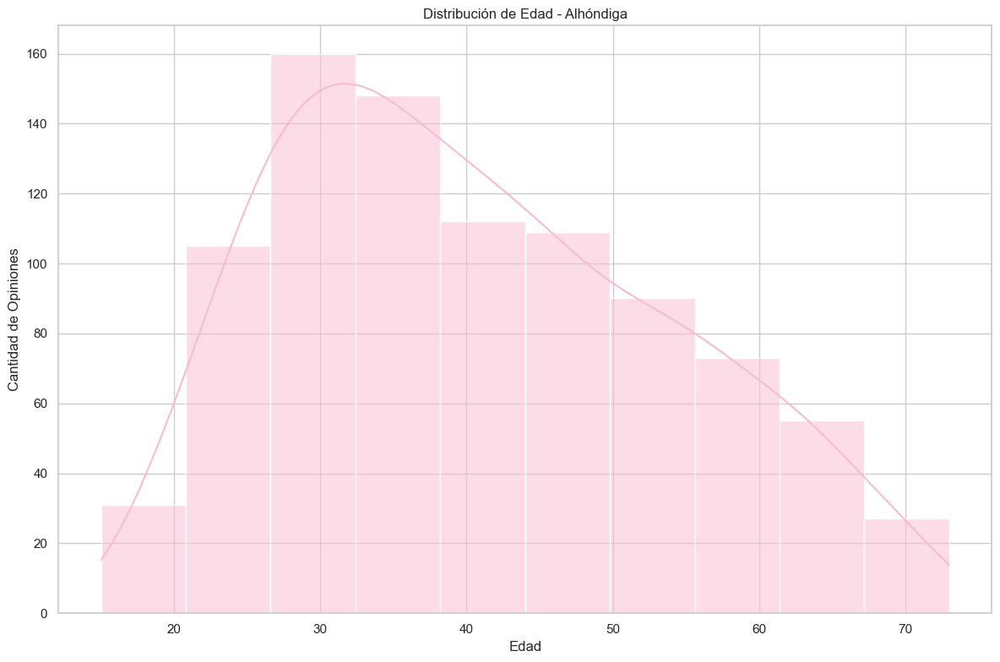

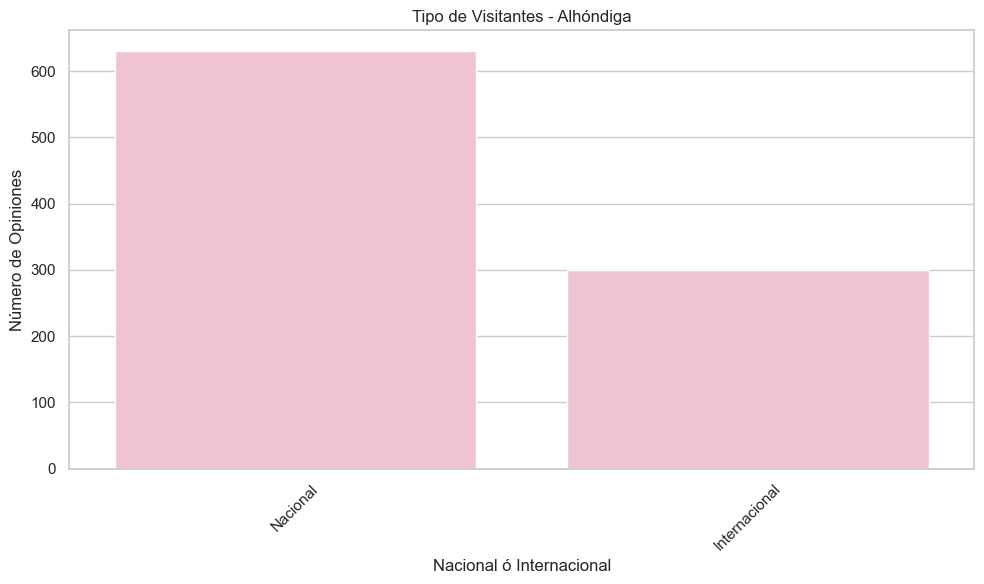

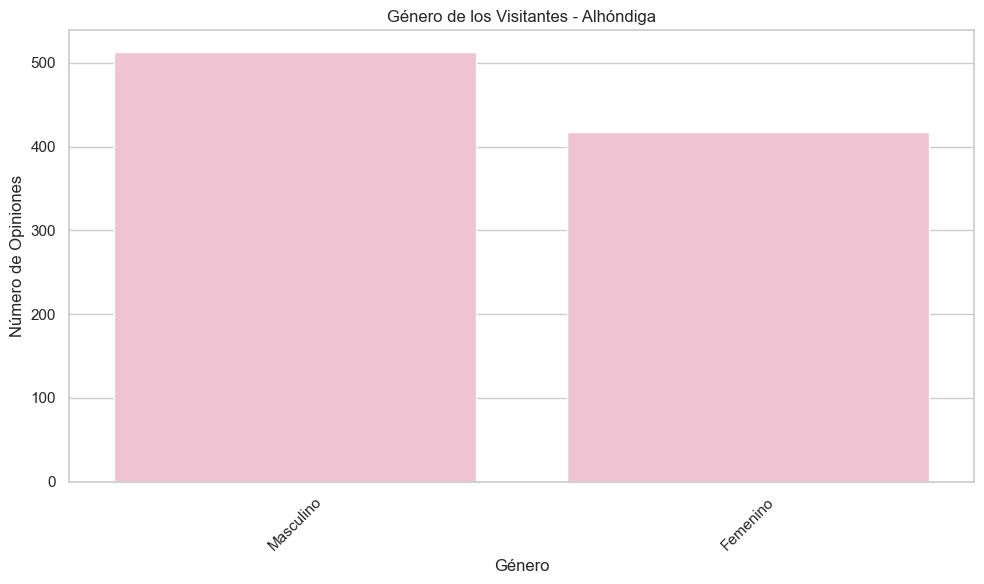

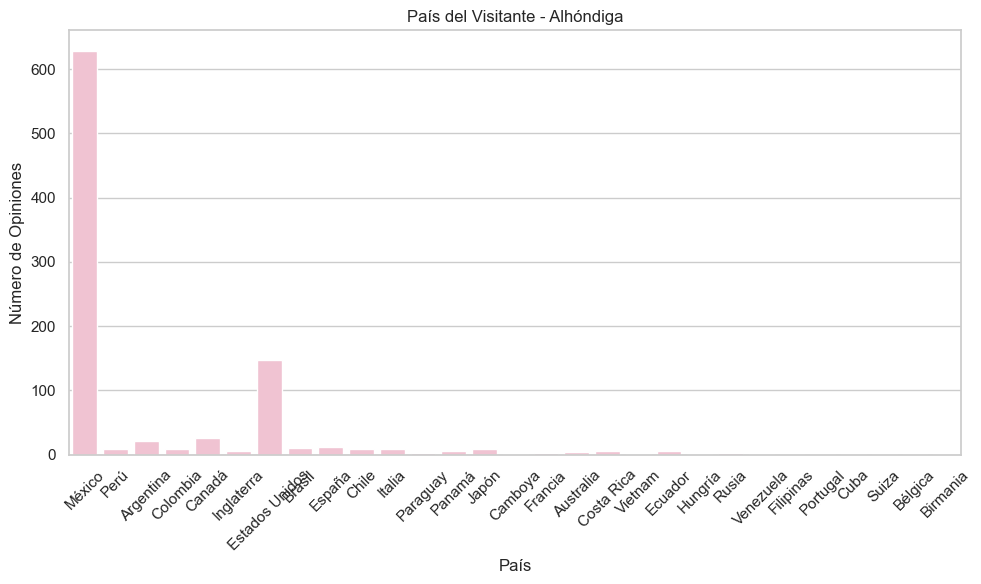

In [6]:
estadisticas_alhondiga = EstadisticasOpiniones(df_alhondiga, nombre_lugar='Alhóndiga')

estadisticas_alhondiga.imprimir_estadisticas_calificacion()
estadisticas_alhondiga.imprimir_estadisticas_opinion()

estadisticas_alhondiga.histograma_edades()
estadisticas_alhondiga.visitantes_nacionales_internacionales()
estadisticas_alhondiga.genero_visitantes()
estadisticas_alhondiga.pais_visitantes()

## Basilica Colegiata


Estadísticas de calificación en Basilica Colegiata:
  index  Calificación_num
0  mean          4.498214
1   std          0.668748

Estadísticas de longitud de opinión en Basilica Colegiata:
  index  Longitud_opinion
0  mean         39.721429
1   std         29.538748


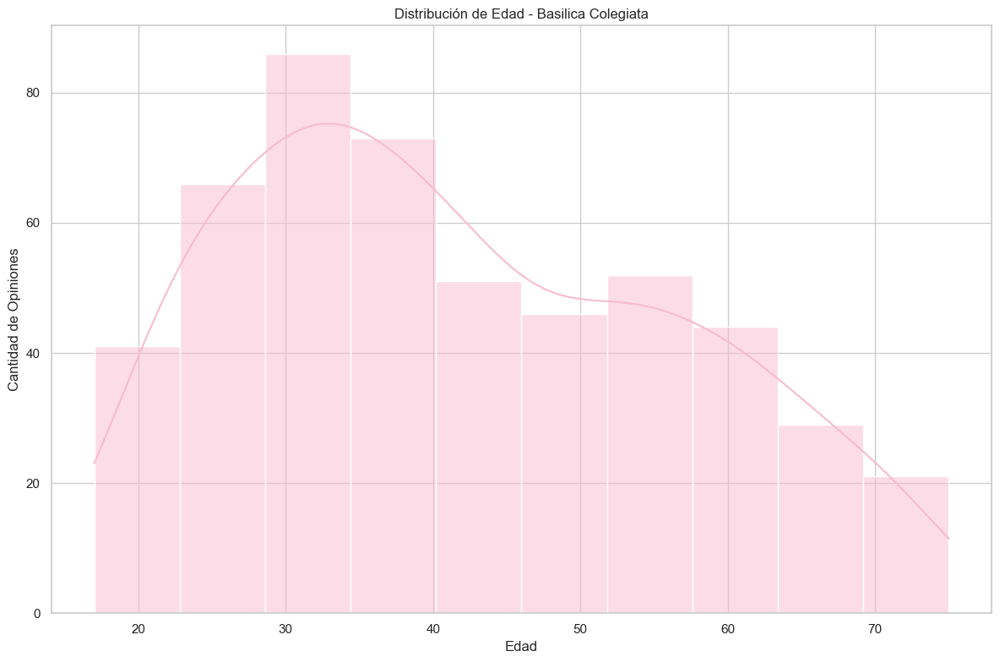

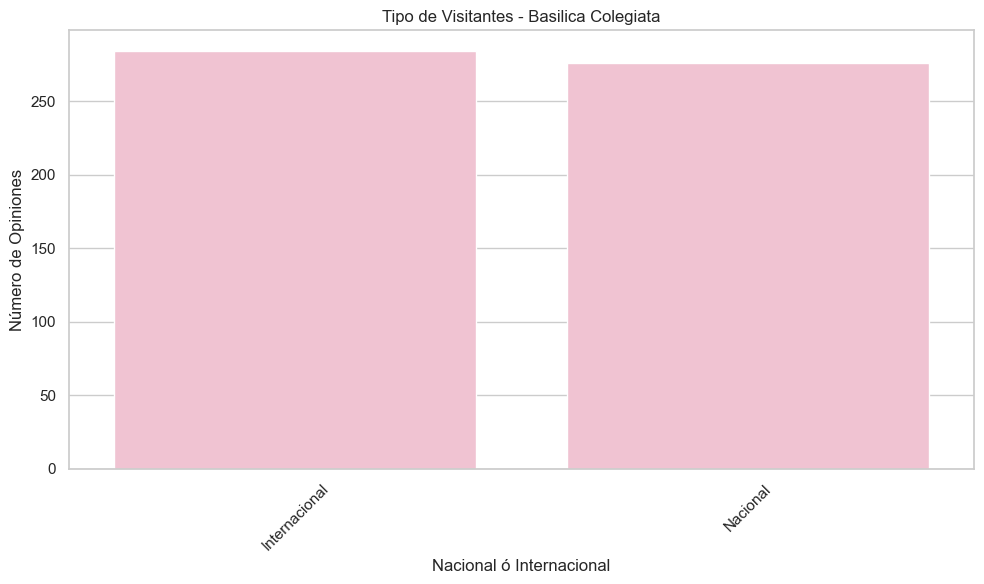

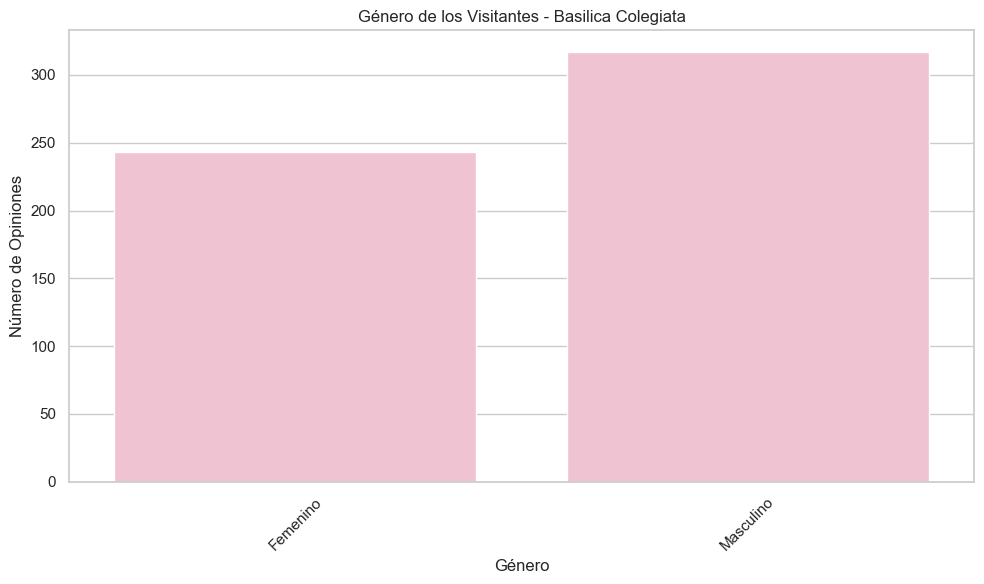

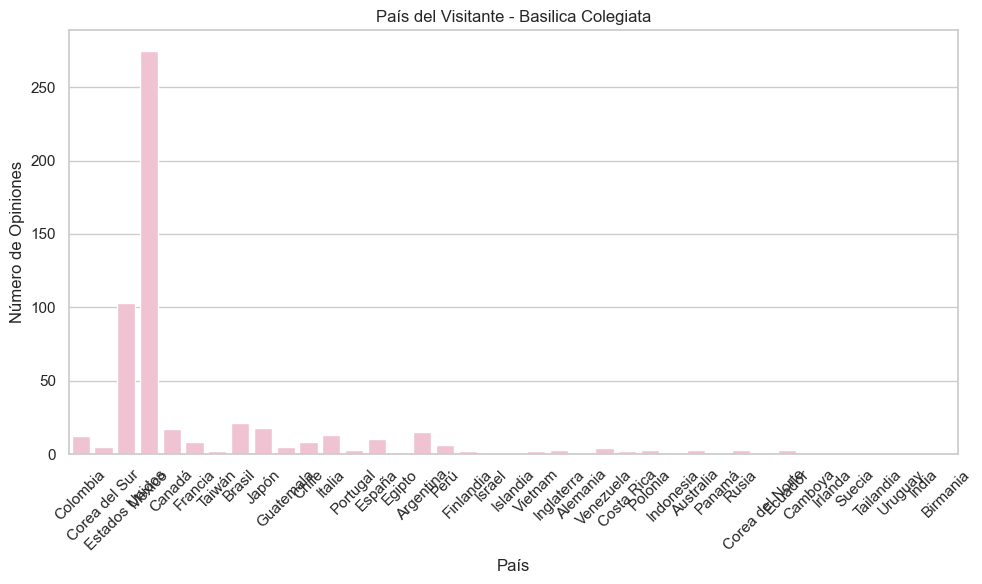

In [7]:
estadisticas_basilica = EstadisticasOpiniones(df_basilica, nombre_lugar='Basilica Colegiata')

estadisticas_basilica.imprimir_estadisticas_calificacion()
estadisticas_basilica.imprimir_estadisticas_opinion()

estadisticas_basilica.histograma_edades()
estadisticas_basilica.visitantes_nacionales_internacionales()
estadisticas_basilica.genero_visitantes()
estadisticas_basilica.pais_visitantes()

## Callejón del Beso


Estadísticas de calificación en Callejón del Beso:
  index  Calificación_num
0  mean          3.995588
1   std          0.971247

Estadísticas de longitud de opinión en Callejón del Beso:
  index  Longitud_opinion
0  mean         45.533088
1   std         32.947284


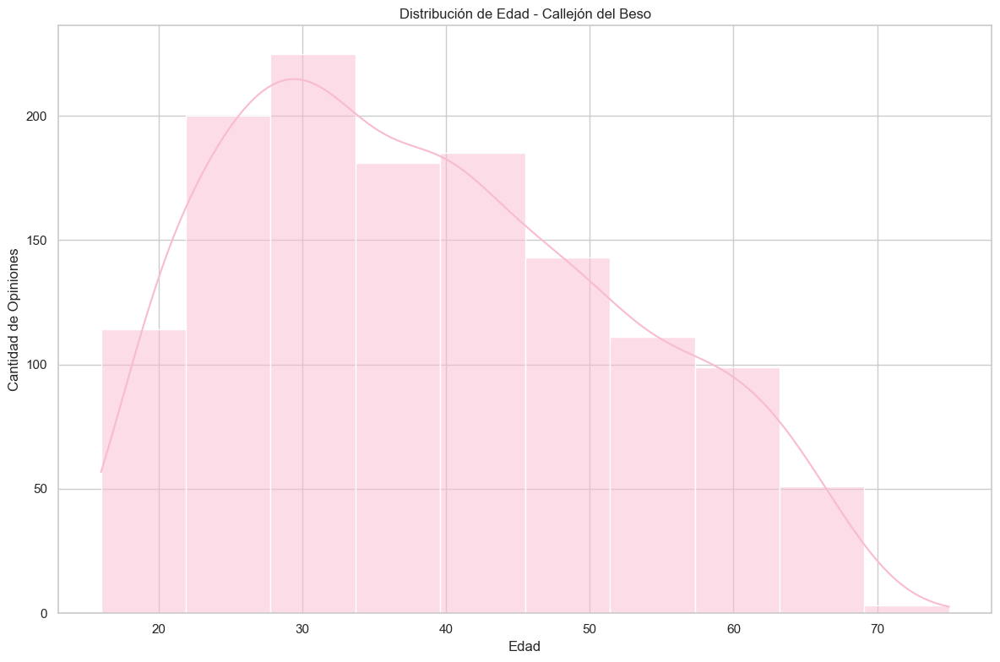

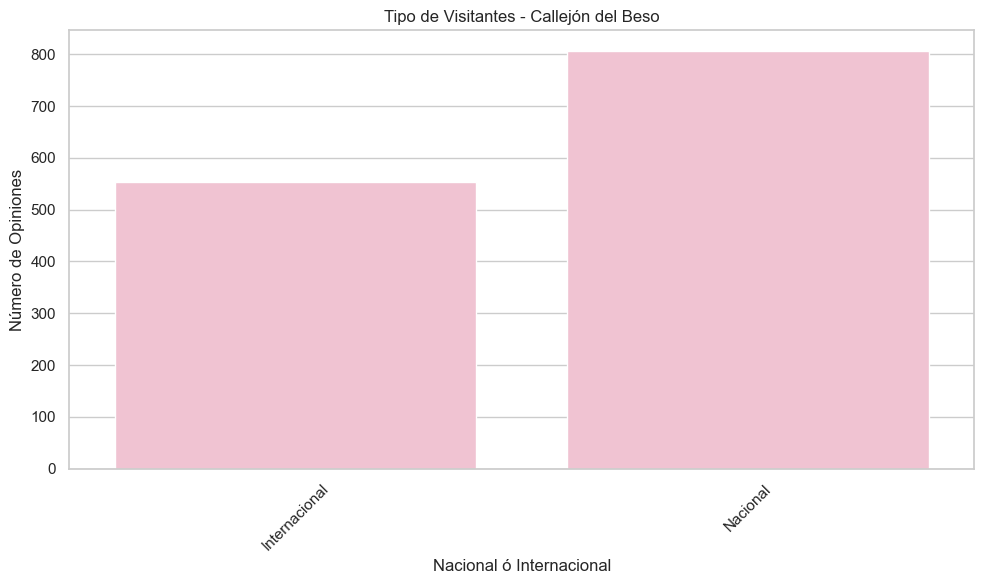

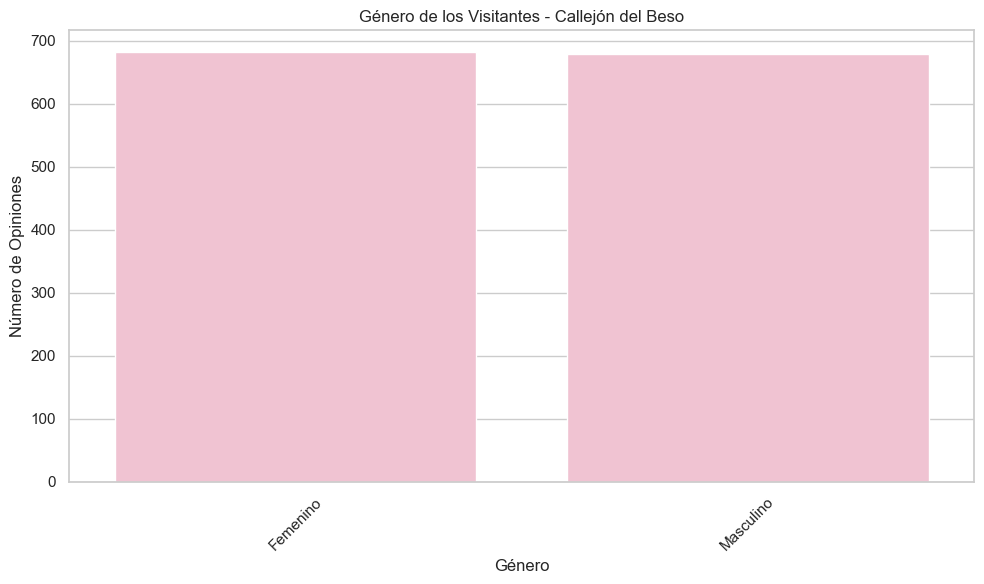

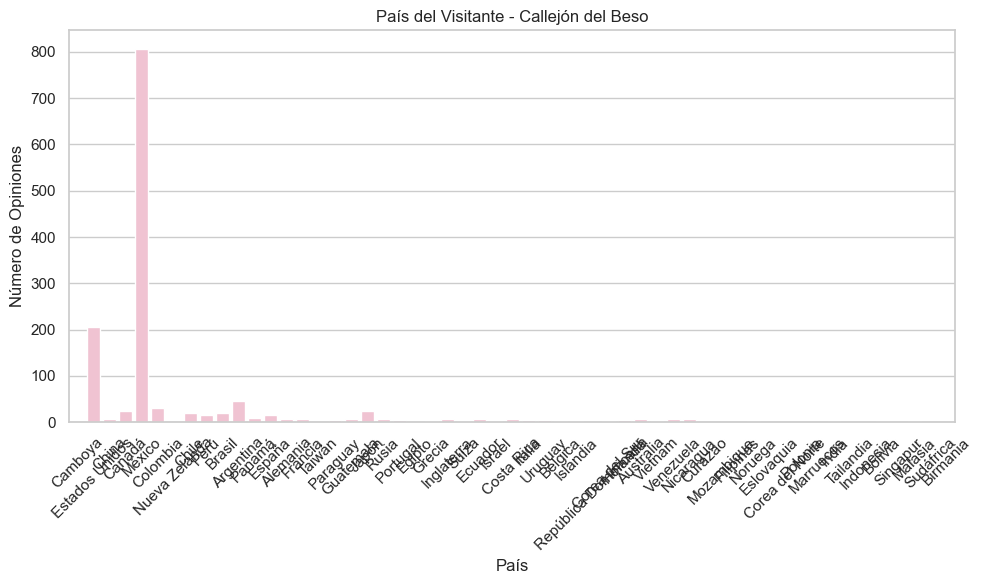

In [8]:
estadisticas_callejon = EstadisticasOpiniones(df_callejondelbeso, nombre_lugar='Callejón del Beso')

estadisticas_callejon.imprimir_estadisticas_calificacion()
estadisticas_callejon.imprimir_estadisticas_opinion()

estadisticas_callejon.histograma_edades()
estadisticas_callejon.visitantes_nacionales_internacionales()
estadisticas_callejon.genero_visitantes()
estadisticas_callejon.pais_visitantes()

## Casa de Diego Rivera


Estadísticas de calificación en Casa de Diego Rivera:
  index  Calificación_num
0  mean          4.242120
1   std          0.805364

Estadísticas de longitud de opinión en Casa de Diego Rivera:
  index  Longitud_opinion
0  mean         49.277937
1   std         30.478067


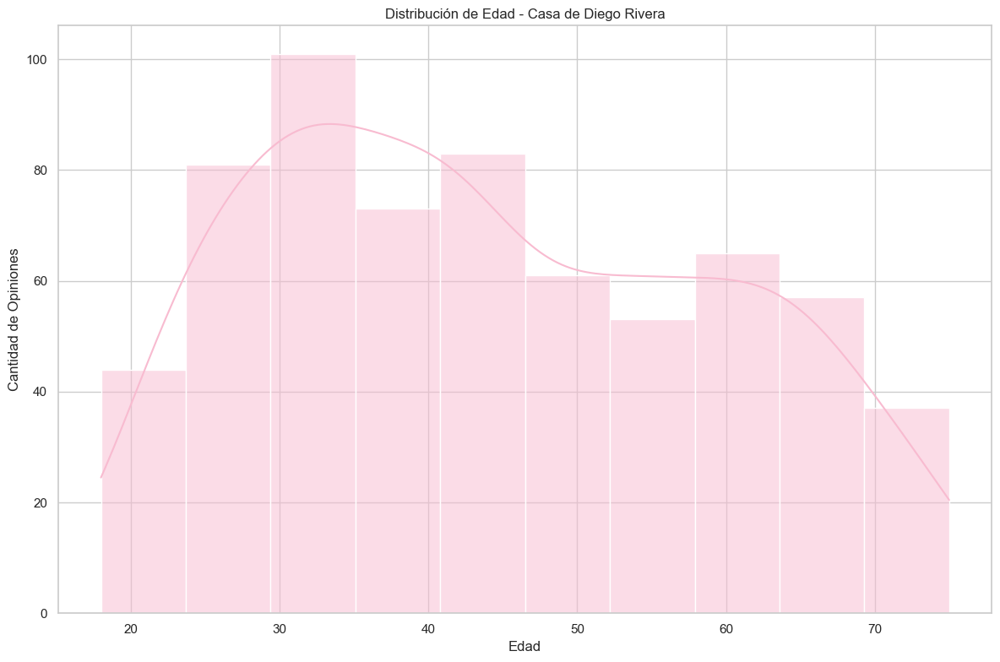

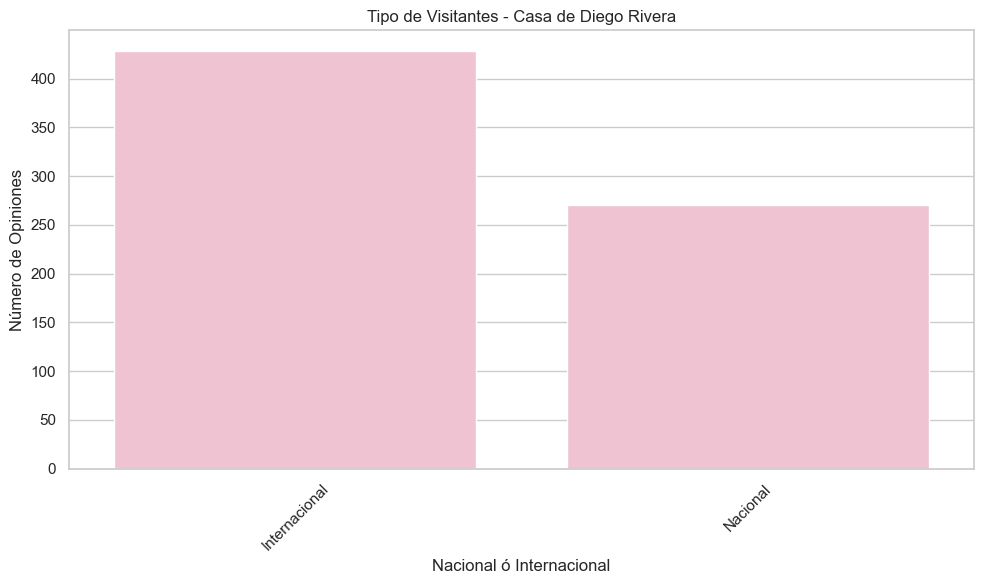

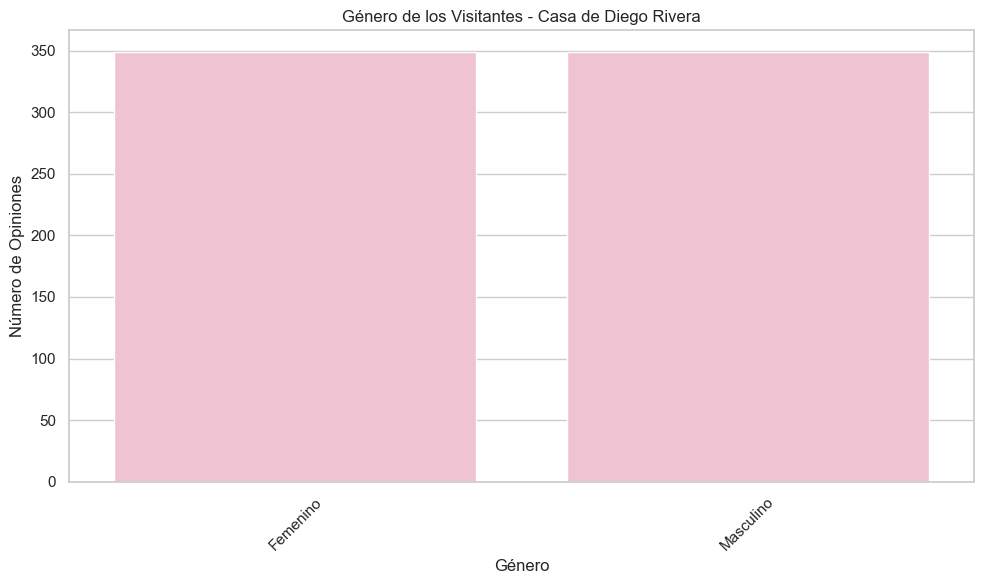

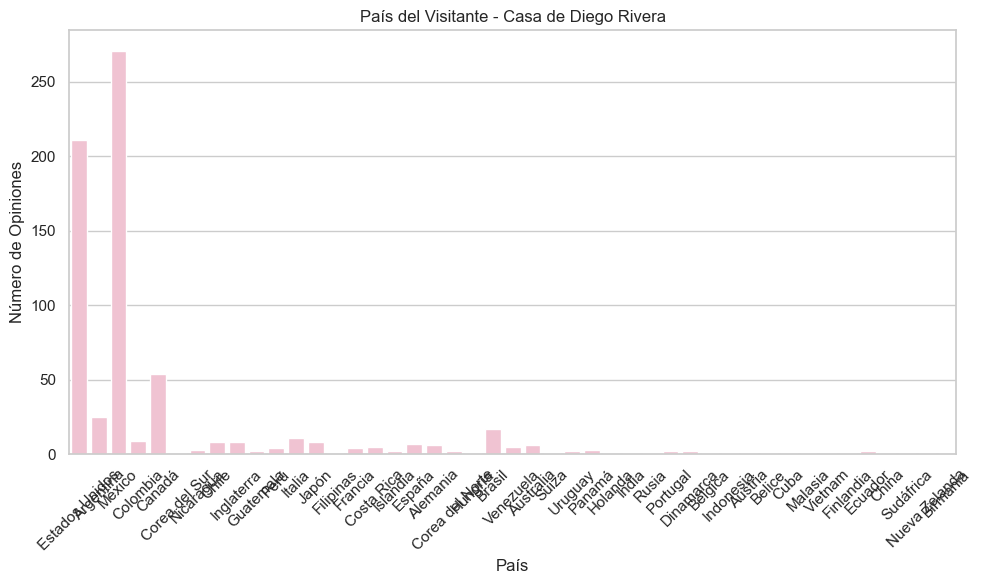

In [9]:
estadisticas_diegoR = EstadisticasOpiniones(df_diegoR, nombre_lugar='Casa de Diego Rivera')

estadisticas_diegoR.imprimir_estadisticas_calificacion()
estadisticas_diegoR.imprimir_estadisticas_opinion()

estadisticas_diegoR.histograma_edades()
estadisticas_diegoR.visitantes_nacionales_internacionales()
estadisticas_diegoR.genero_visitantes()
estadisticas_diegoR.pais_visitantes()

## Jardín de la Unión


Estadísticas de calificación en Jardín de la Unión:
  index  Calificación_num
0  mean          4.593474
1   std          0.602724

Estadísticas de longitud de opinión en Jardín de la Unión:
  index  Longitud_opinion
0  mean         43.140212
1   std         37.018050


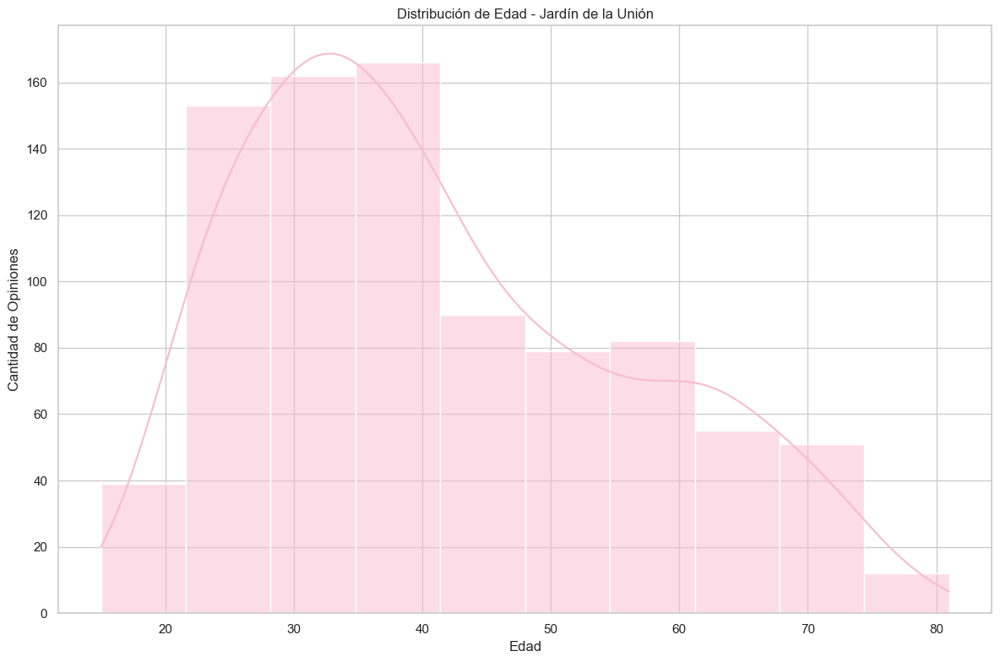

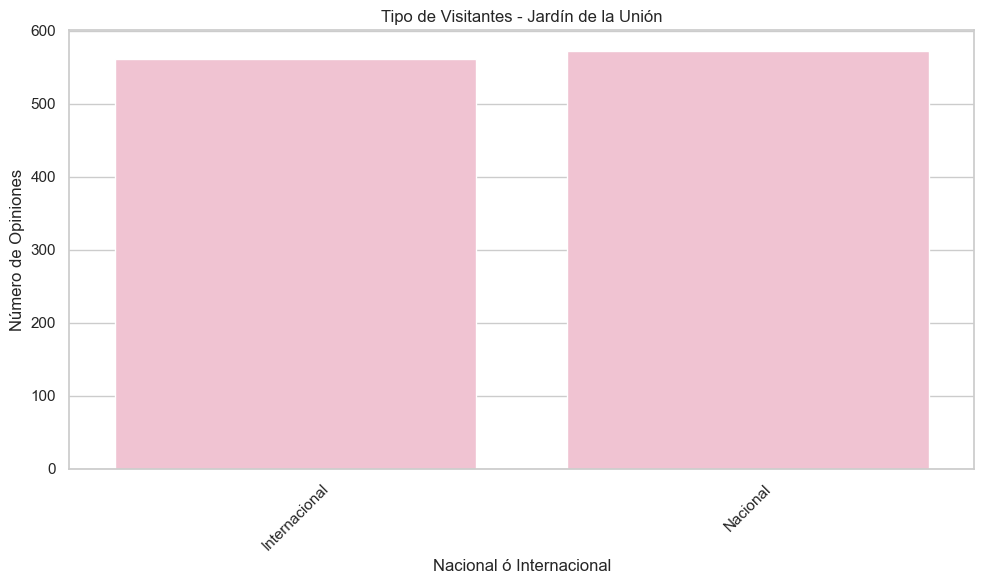

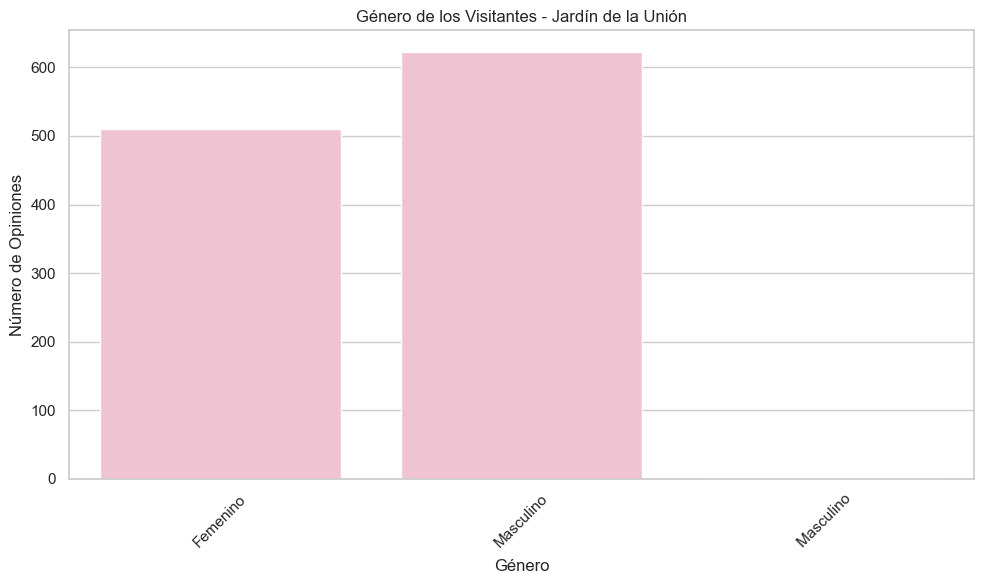

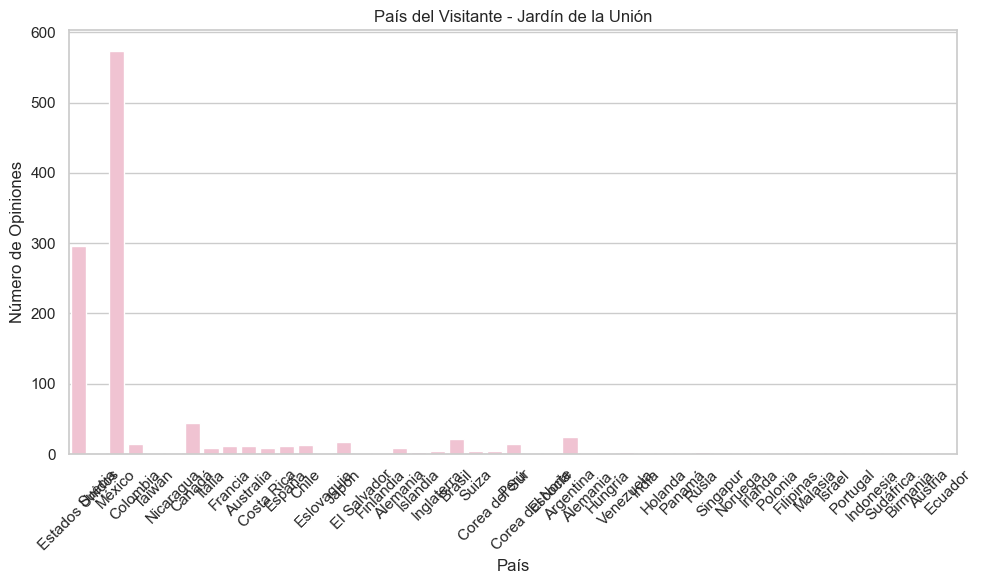

In [10]:
estadisticas_jardinU = EstadisticasOpiniones(df_jardinU, nombre_lugar='Jardín de la Unión')

estadisticas_jardinU.imprimir_estadisticas_calificacion()
estadisticas_jardinU.imprimir_estadisticas_opinion()

estadisticas_jardinU.histograma_edades()
estadisticas_jardinU.visitantes_nacionales_internacionales()
estadisticas_jardinU.genero_visitantes()
estadisticas_jardinU.pais_visitantes()

## Mercado Hidalgo


Estadísticas de calificación en Mercado Hidalgo:
  index  Calificación_num
0  mean          3.948333
1   std          0.950703

Estadísticas de longitud de opinión en Mercado Hidalgo:
  index  Longitud_opinion
0  mean         45.625000
1   std         33.490851


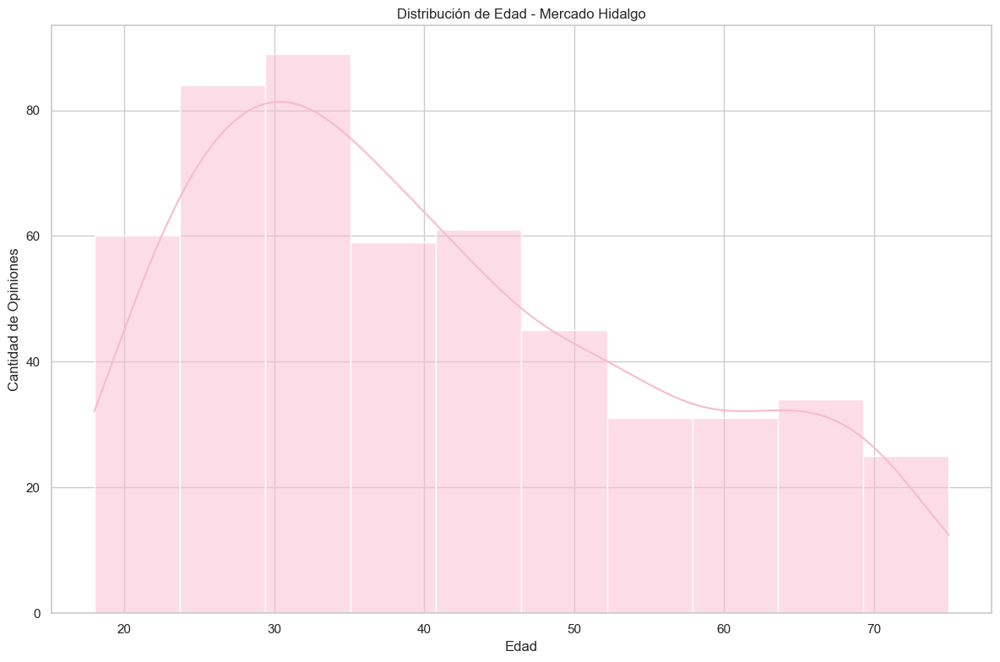

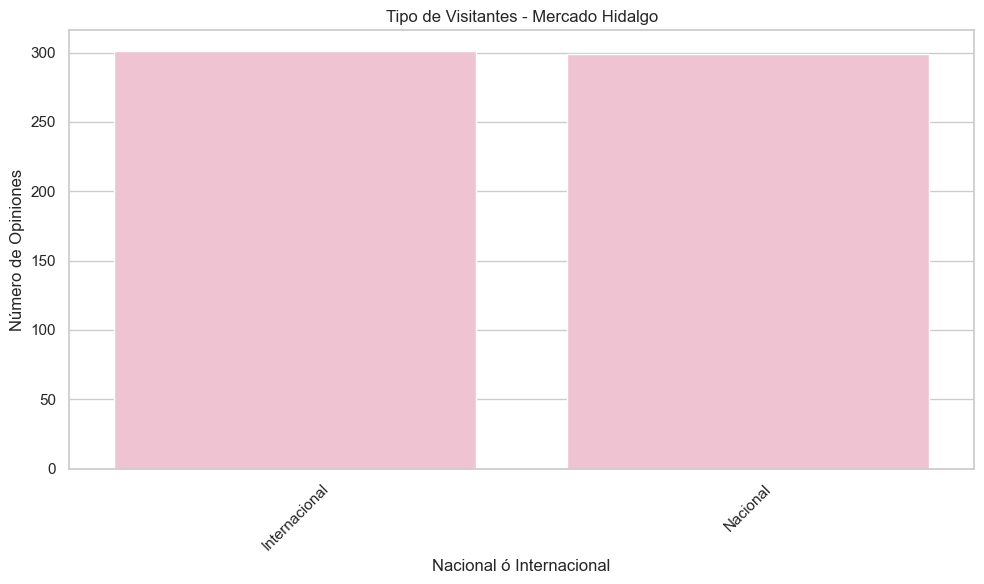

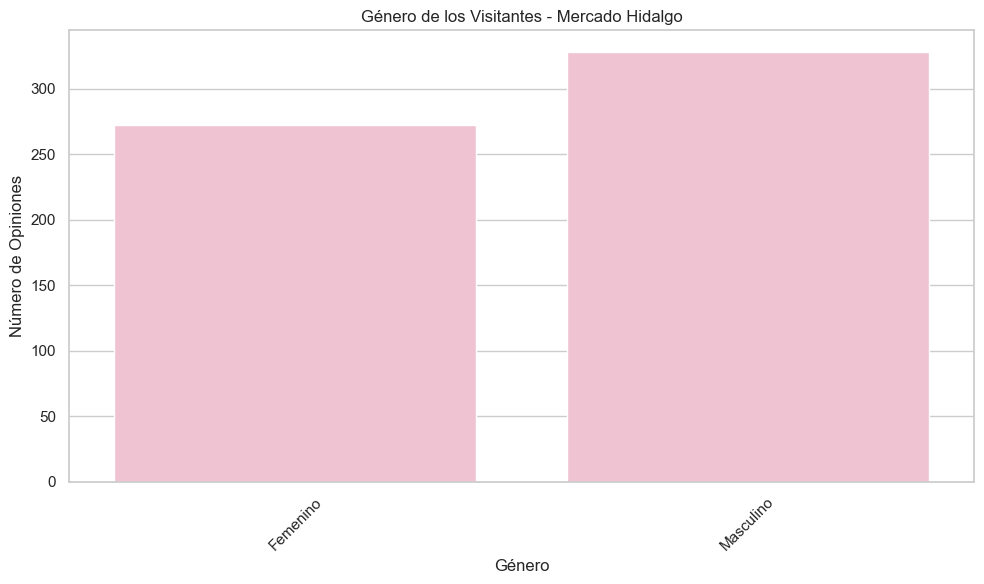

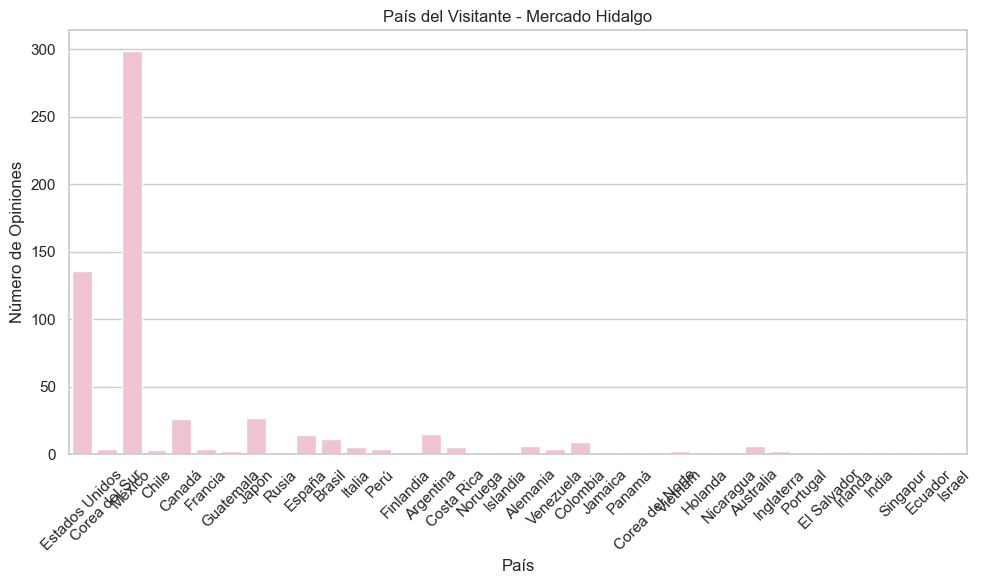

In [11]:
estadisticas_mercado = EstadisticasOpiniones(df_mercado, nombre_lugar='Mercado Hidalgo')

estadisticas_mercado.imprimir_estadisticas_calificacion()
estadisticas_mercado.imprimir_estadisticas_opinion()

estadisticas_mercado.histograma_edades()
estadisticas_mercado.visitantes_nacionales_internacionales()
estadisticas_mercado.genero_visitantes()
estadisticas_mercado.pais_visitantes()

## Monumento Pípila


Estadísticas de calificación en Monumento Pípila:
  index  Calificación_num
0  mean          4.377778
1   std          0.767950

Estadísticas de longitud de opinión en Monumento Pípila:
  index  Longitud_opinion
0  mean         47.382716
1   std         35.921202


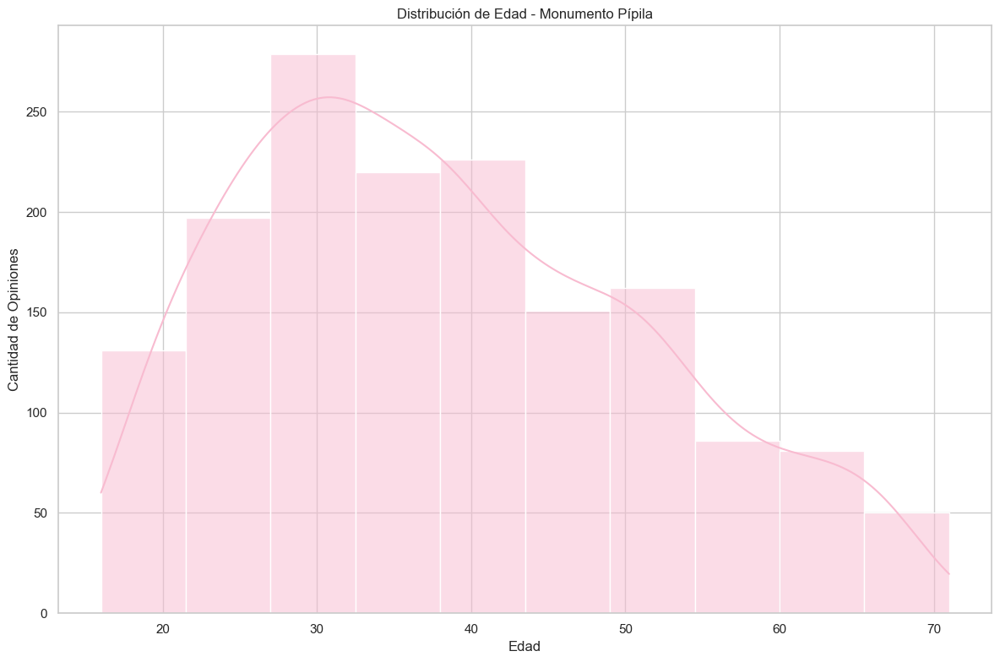

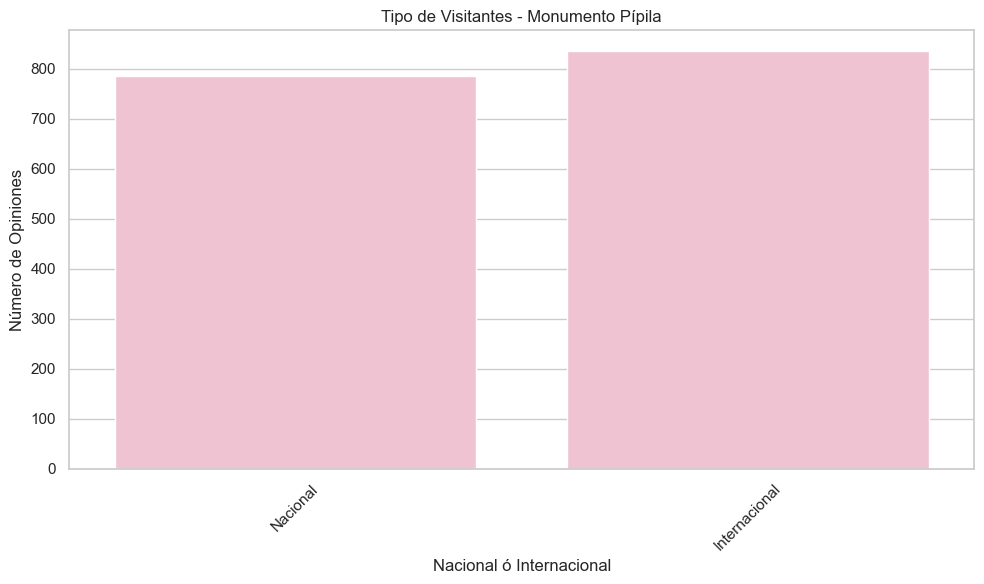

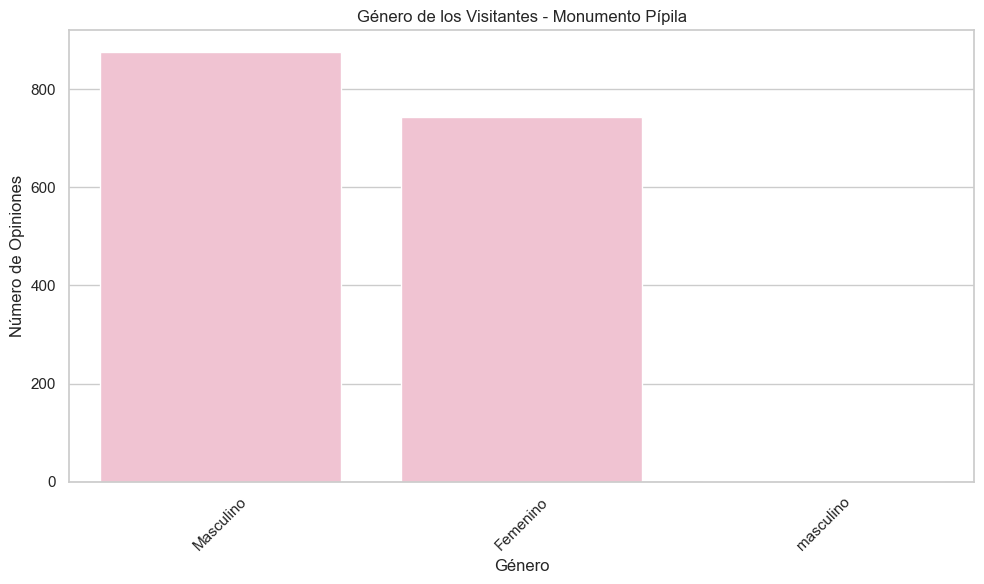

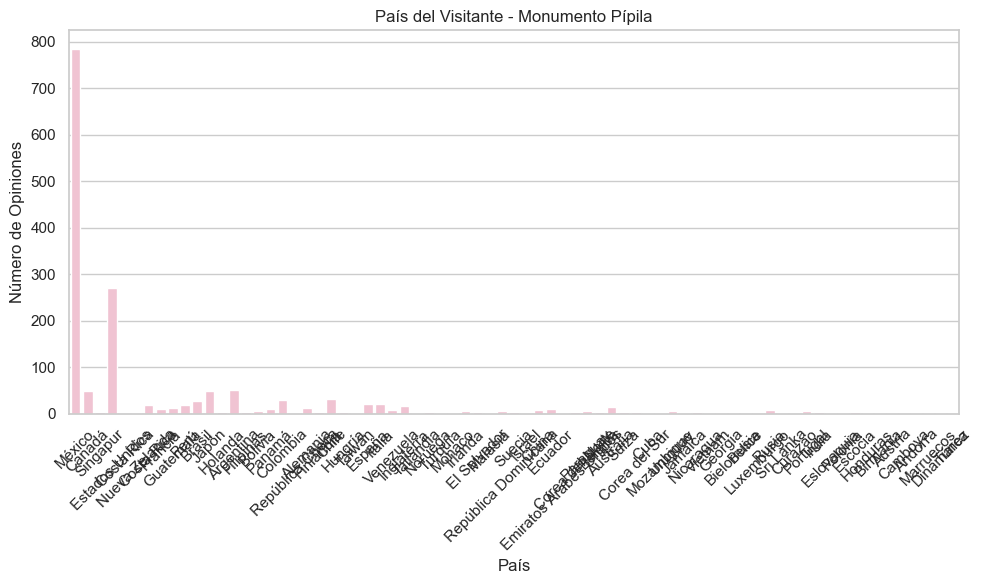

In [12]:
estadisticas_pipila = EstadisticasOpiniones(df_pipila, nombre_lugar='Monumento Pípila')

estadisticas_pipila.imprimir_estadisticas_calificacion()
estadisticas_pipila.imprimir_estadisticas_opinion()

estadisticas_pipila.histograma_edades()
estadisticas_pipila.visitantes_nacionales_internacionales()
estadisticas_pipila.genero_visitantes()
estadisticas_pipila.pais_visitantes()

## Museo de las Momias


Estadísticas de calificación en Museo de las Momias:
  index  Calificación_num
0  mean          3.675152
1   std          1.136495

Estadísticas de longitud de opinión en Museo de las Momias:
  index  Longitud_opinion
0  mean         58.226061
1   std         46.520291


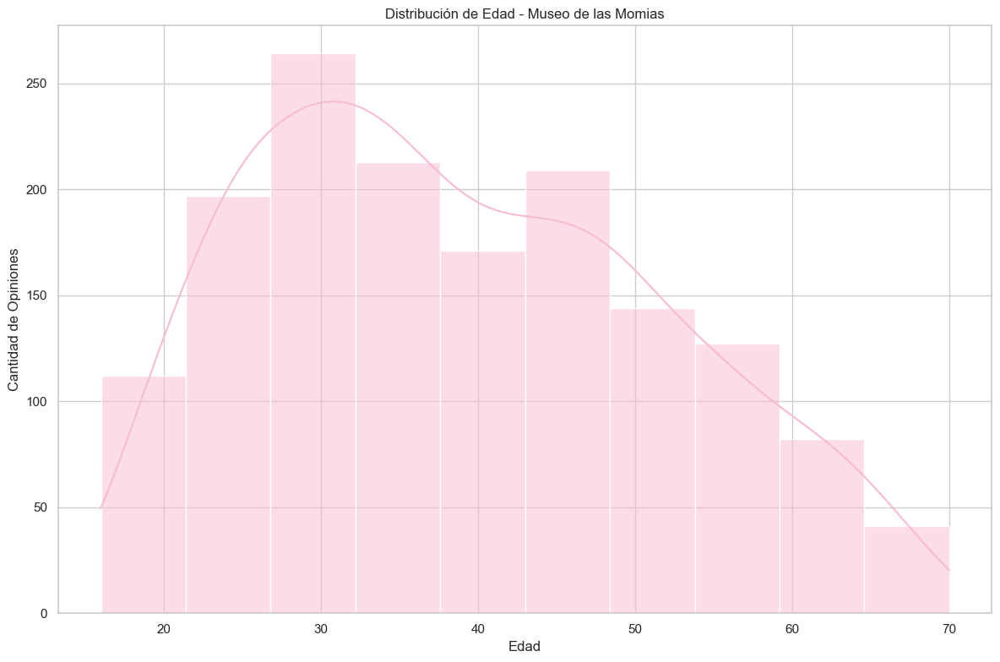

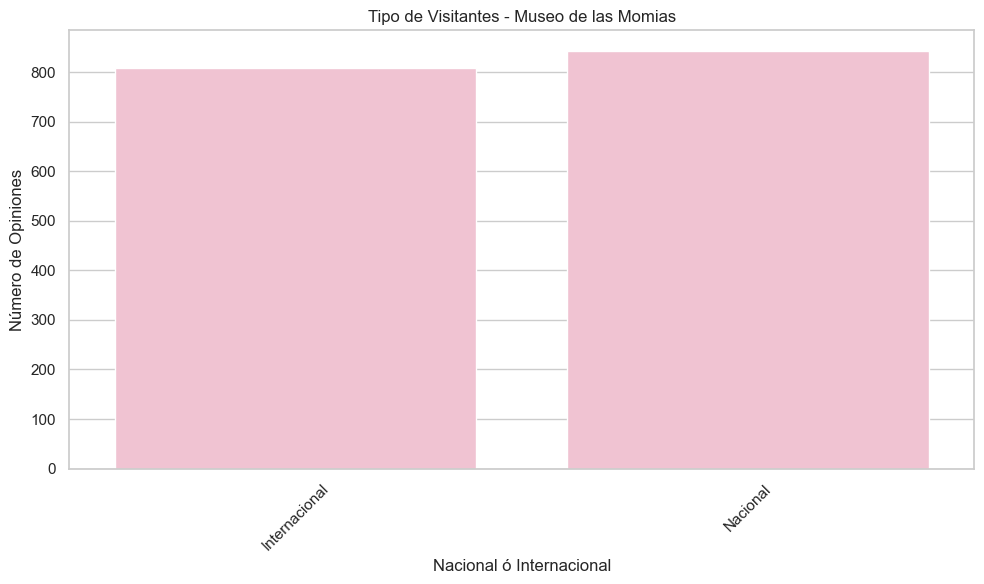

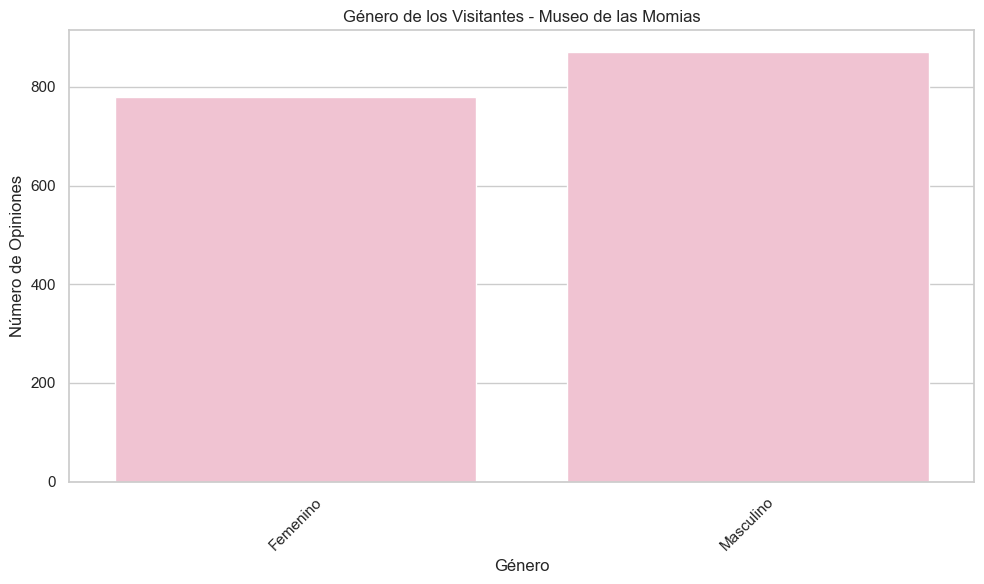

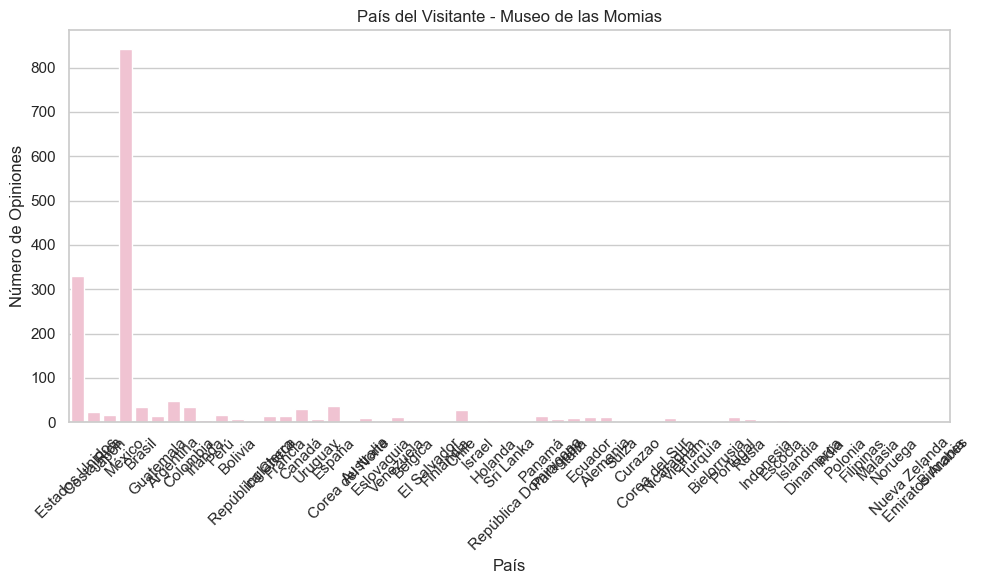

In [13]:
estadisticas_momias = EstadisticasOpiniones(df_momias, nombre_lugar='Museo de las Momias')

estadisticas_momias.imprimir_estadisticas_calificacion()
estadisticas_momias.imprimir_estadisticas_opinion()

estadisticas_momias.histograma_edades()
estadisticas_momias.visitantes_nacionales_internacionales()
estadisticas_momias.genero_visitantes()
estadisticas_momias.pais_visitantes()

## Teatro Juárez


Estadísticas de calificación en Teatro Juárez:
  index  Calificación_num
0  mean          4.702970
1   std          0.518146

Estadísticas de longitud de opinión en Teatro Juárez:
  index  Longitud_opinion
0  mean         41.500990
1   std         27.116211


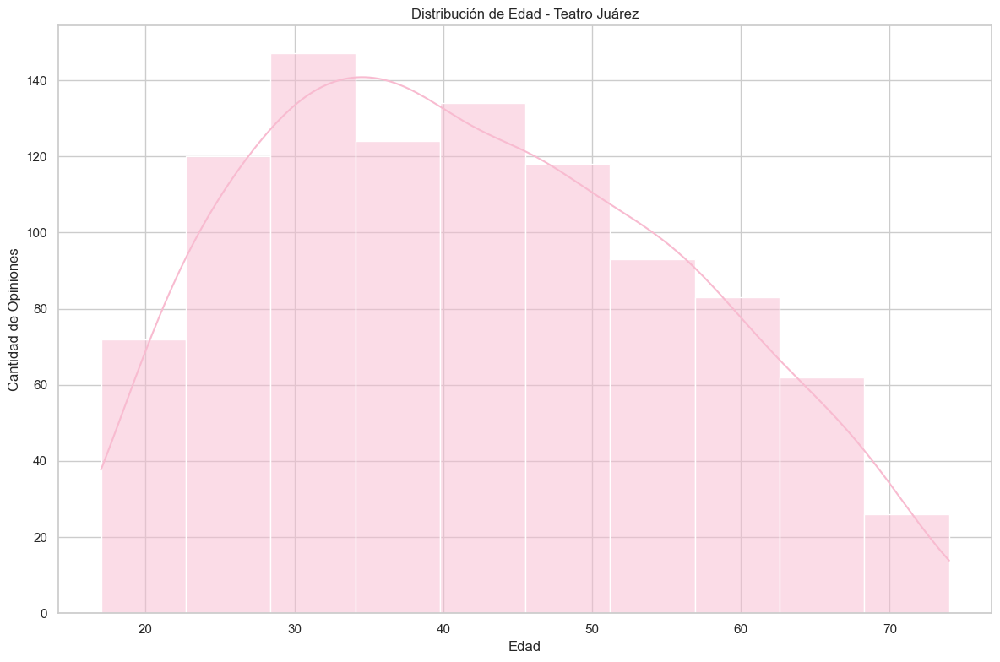

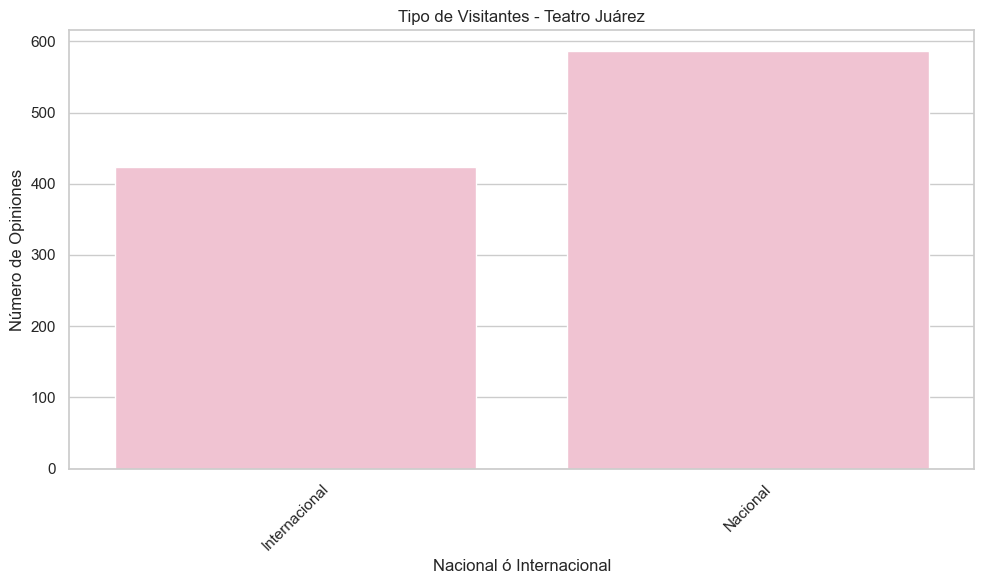

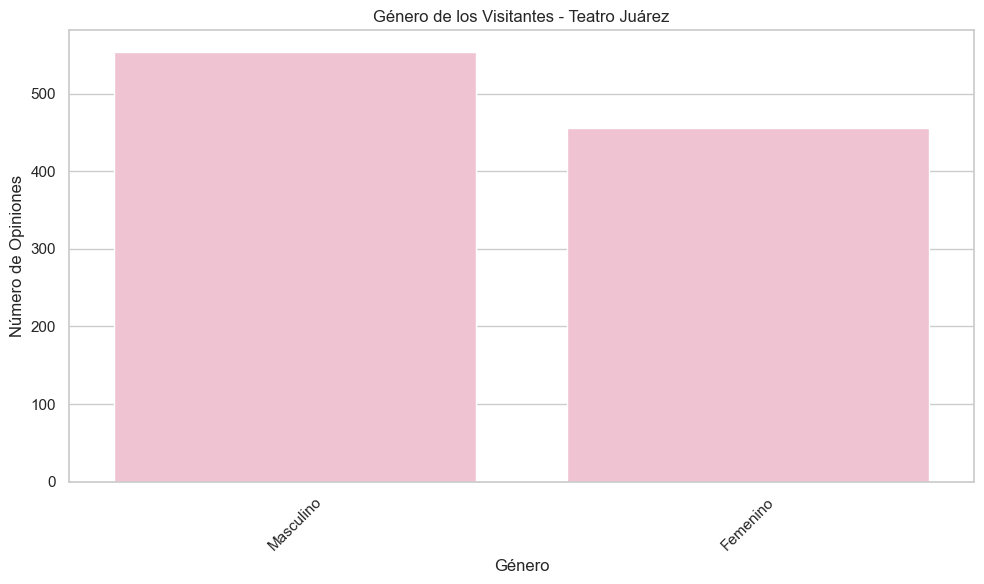

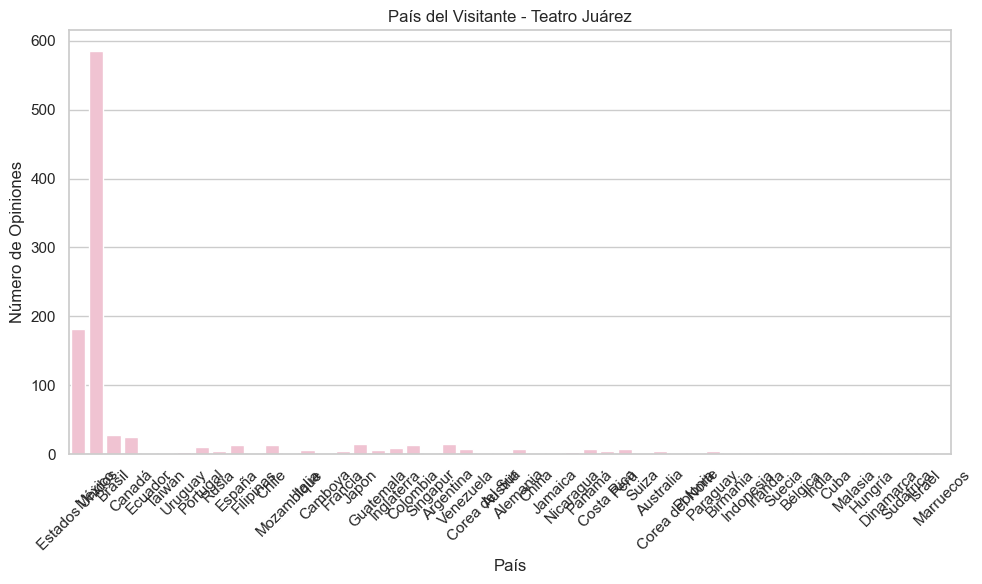

In [14]:
estadisticas_juarez = EstadisticasOpiniones(df_juarez, nombre_lugar='Teatro Juárez')

estadisticas_juarez.imprimir_estadisticas_calificacion()
estadisticas_juarez.imprimir_estadisticas_opinion()

estadisticas_juarez.histograma_edades()
estadisticas_juarez.visitantes_nacionales_internacionales()
estadisticas_juarez.genero_visitantes()
estadisticas_juarez.pais_visitantes()

## Universidad de Guanajuato


Estadísticas de calificación en Universidad de Guanajuato:
  index  Calificación_num
0  mean          4.603333
1   std          0.612613

Estadísticas de longitud de opinión en Universidad de Guanajuato:
  index  Longitud_opinion
0  mean         35.394444
1   std         20.057286


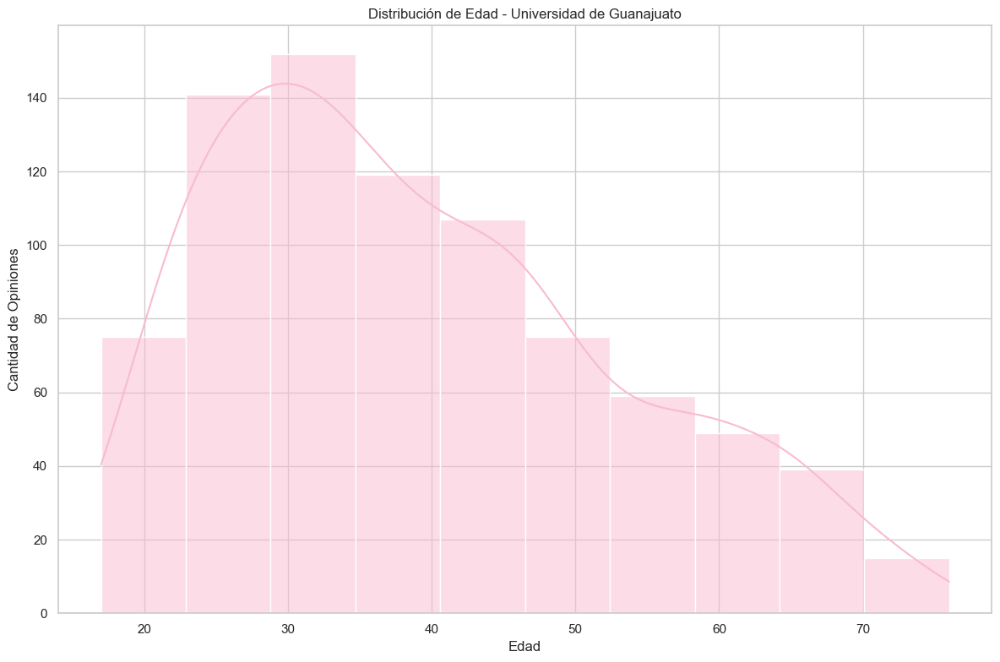

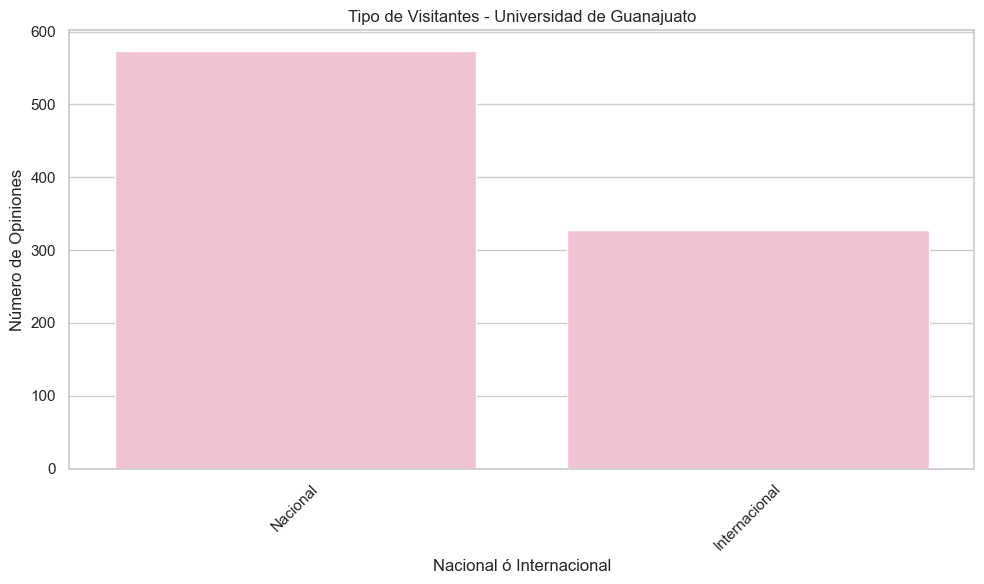

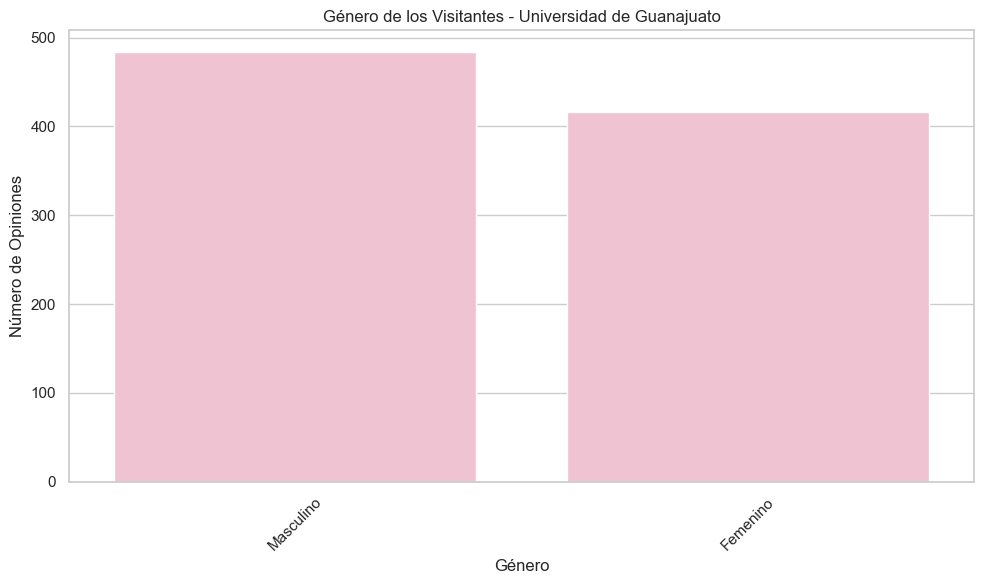

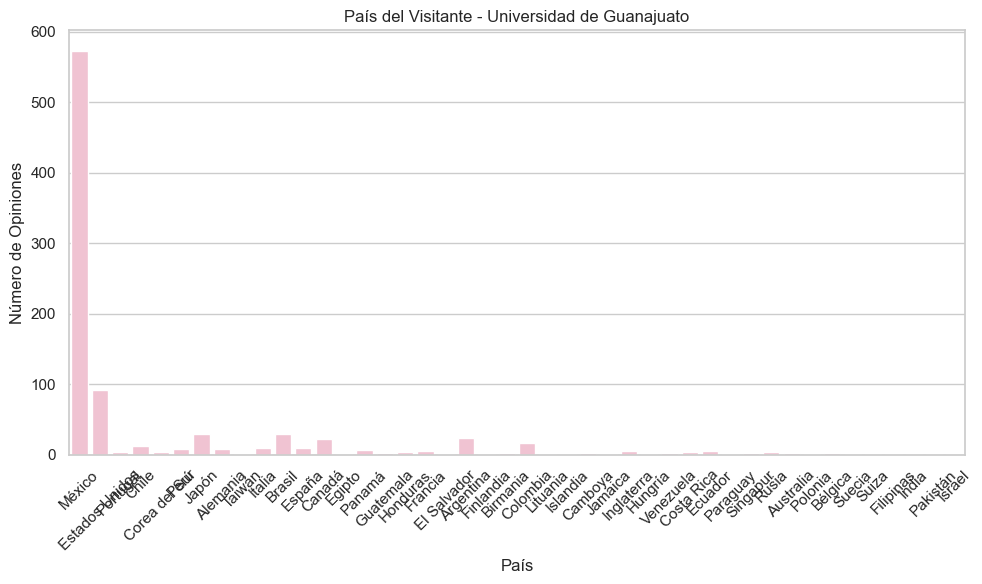

In [15]:
estadisticas_ug = EstadisticasOpiniones(df_ug, nombre_lugar='Universidad de Guanajuato')

estadisticas_ug.imprimir_estadisticas_calificacion()
estadisticas_ug.imprimir_estadisticas_opinion()

estadisticas_ug.histograma_edades()
estadisticas_ug.visitantes_nacionales_internacionales()
estadisticas_ug.genero_visitantes()
estadisticas_ug.pais_visitantes()

# 2.
Utilizando una estrategia de feature selection (se sugiere X2 o ganancia de información) visualice con word_cloud ( https://amueller.github.io/word_cloud/ ) nubes de palabras el top k (se sugiere 50) de palabras más relevantes para cada uno de los 10 lugares. Note que serán 10 nubes, una por lugar.

Dado que hay algunas opiniones en inglés y otras en español, se importarán stopwords en nlkt y en wourdcloud en inglés y español antes de hacer las nubes. 

In [20]:
from nltk.corpus import stopwords
from wordcloud import STOPWORDS
import re
from collections import Counter
from wordcloud import WordCloud
from sklearn.preprocessing import LabelEncoder
from nltk.tokenize import word_tokenize

class AnalisisTextual:
    def __init__(self, dataframe, nombre_lugar="Lugar"):
        self.df = dataframe.copy()
        self.nombre_lugar = nombre_lugar
        self.stopwords_total = self._cargar_stopwords()
        self._preprocesar_texto()
        self.vocab = None
        self.vectorizer = None
        self.bow = None
        if 'Tipo_score' not in self.df.columns:
            calificacion_map = {'Excelente': 5, 'Muy bueno': 4, 'Regular': 3, 'Malo': 2, 'Pésimo': 1}
            self.df['Calificación_num'] = self.df['Calificación'].map(calificacion_map)
            self.df['Tipo_score'] = self.df['Calificación'].apply(self._scores_calificacion)
        self.labels = self.df.loc[self.df['Opinión'].notnull(), 'Tipo_score']
        

    def _scores_calificacion(self, calificacion):
        if calificacion in ['Excelente', 'Muy bueno']:
            return 'Positivo'
        elif calificacion == 'Regular':
            return 'Neutro'
        else:
            return 'Negativo'
    
    def _cargar_stopwords(self):
        stopwords_es = set(stopwords.words('spanish'))
        stopwords_en = set(stopwords.words('english'))
        return STOPWORDS.union(stopwords_es).union(stopwords_en)

    def _preprocesar_texto(self):
        self.df['Opinión'] = self.df['Opinión'].astype(str).apply(self._limpiar_texto)

    
    def _limpiar_texto(self, texto):
        texto = texto.lower()
        texto = re.sub(r'\d+', '', texto)
        texto = re.sub(r'[^\w\s]', '', texto)
        tokens = word_tokenize(texto)
        tokens = [t for t in tokens if t not in self.stopwords_total and len(t) > 2]
        return " ".join(tokens)

    def _vectorizar(self, idioma='both'):
        lang_stopwords = None
        if idioma == 'spanish':
            lang_stopwords = list(stopwords.words('spanish'))
        elif idioma == 'english':
            lang_stopwords = list(stopwords.words('english'))
        elif idioma == 'both':
            lang_stopwords = list(self.stopwords_total)

        opiniones = self.df['Opinión'].dropna()
        self.vectorizer = CountVectorizer(stop_words=lang_stopwords, max_features=5000)
        self.bow = self.vectorizer.fit_transform(opiniones)
        self.vocab = self.vectorizer.get_feature_names_out()


    def generar_wordcloud_chi2(self, top_k=50):
        self._vectorizar()
        y_encoded = LabelEncoder().fit_transform(self.labels)
        chi2_scores, _ = chi2(self.bow, y_encoded)
        chi2_dict = dict(zip(self.vocab, chi2_scores))
        top_words = dict(sorted(chi2_dict.items(), key=lambda item: item[1], reverse=True)[:top_k])
        self._mostrar_wordcloud(top_words, "Top 50 palabras por Chi-cuadrado (χ²)")
        self.top_k_chi2 = top_words


    def _mostrar_wordcloud(self, frecuencia, titulo):
        wordcloud = WordCloud(width=800, height=400, background_color='white')
        wordcloud.generate_from_frequencies(frecuencia)
        plt.figure(figsize=(12, 6))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f"{titulo} - {self.nombre_lugar}")
        plt.show()


## Alhóndiga

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


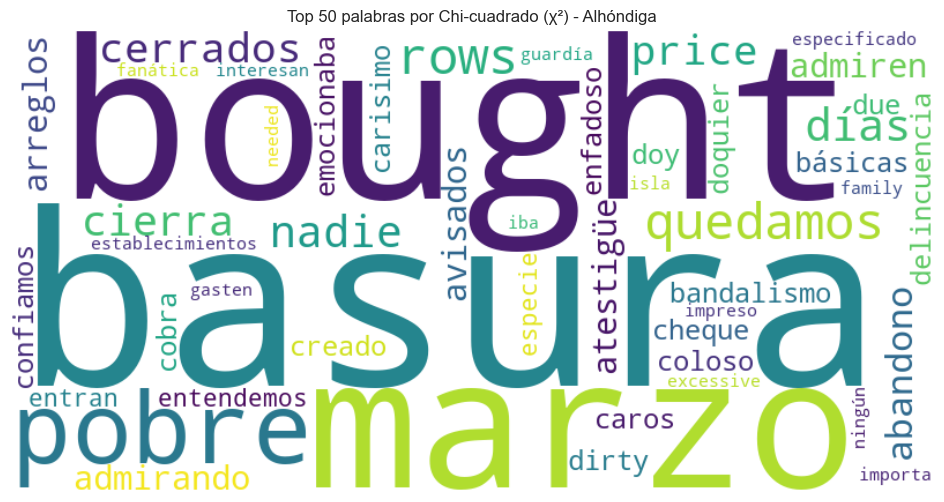

In [21]:
analisis_alhondiga = AnalisisTextual(df_alhondiga, nombre_lugar='Alhóndiga')
analisis_alhondiga.generar_wordcloud_chi2()

## Basilica Colegiata

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


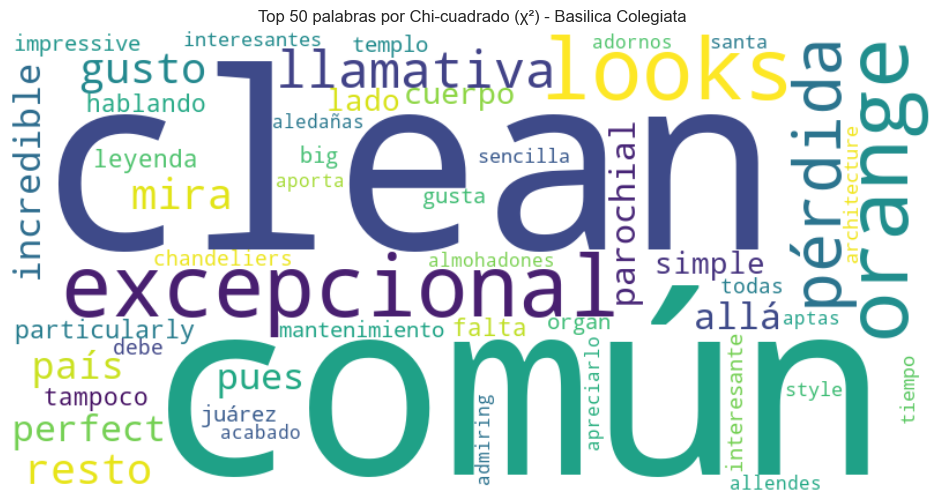

In [22]:
analisis_basilica = AnalisisTextual(df_basilica, nombre_lugar='Basilica Colegiata')
analisis_basilica.generar_wordcloud_chi2()

## Callejón del Beso

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


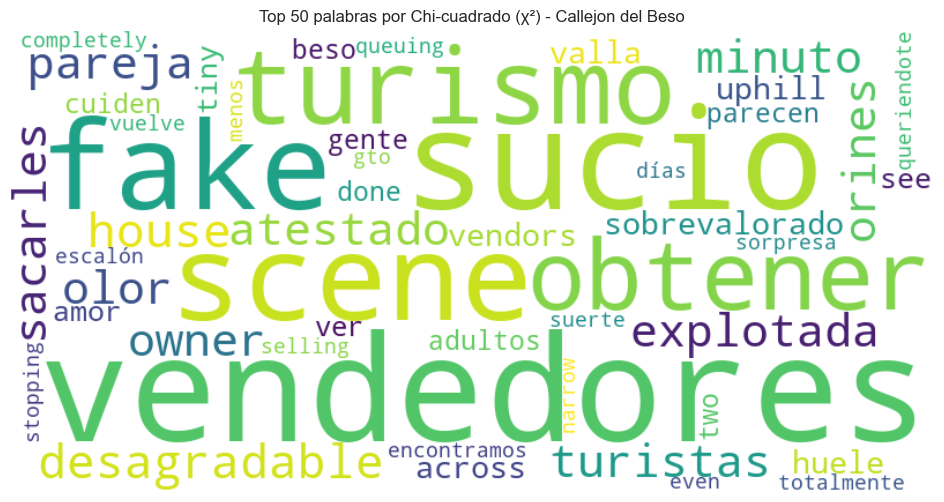

In [23]:
analisis_callejondelbeso = AnalisisTextual(df_callejondelbeso, nombre_lugar='Callejon del Beso')
analisis_callejondelbeso.generar_wordcloud_chi2()

## Casa de Diego Rivera

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


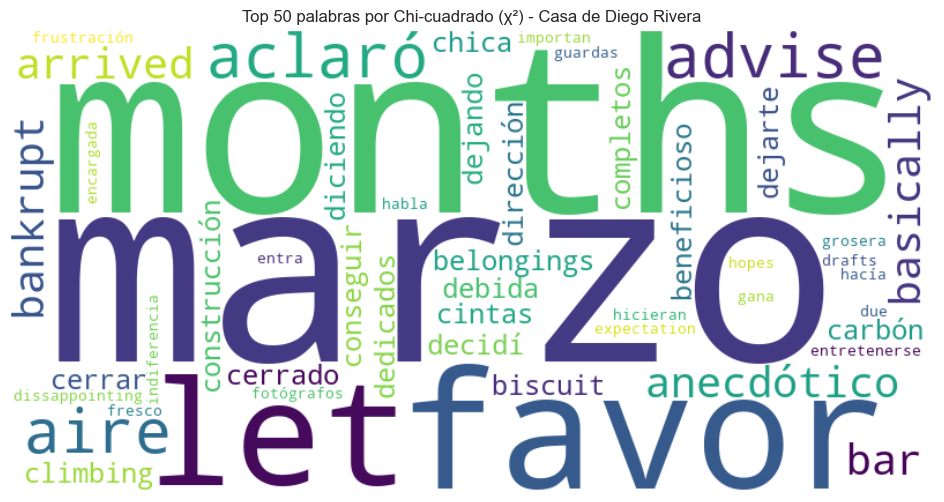

In [24]:
analisis_diegoR = AnalisisTextual(df_diegoR , nombre_lugar='Casa de Diego Rivera')
analisis_diegoR.generar_wordcloud_chi2()

## Jardín de la Unión

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


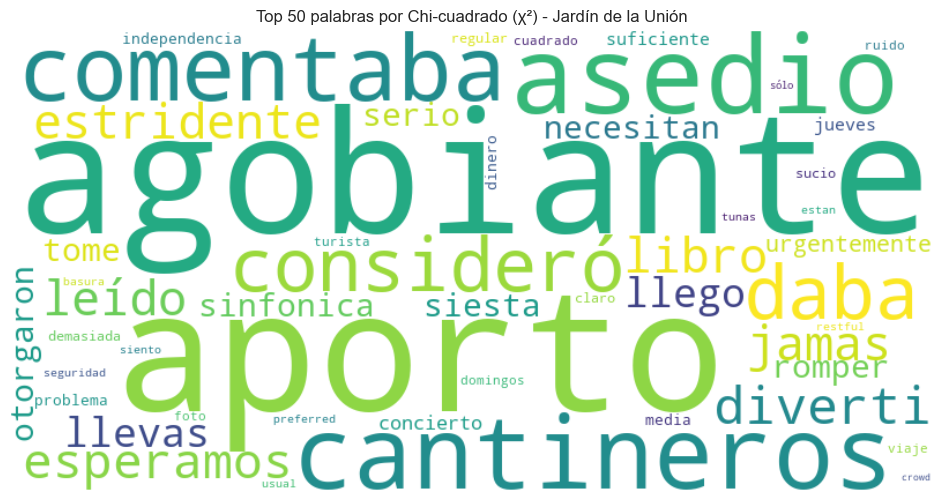

In [25]:
analisis_jardinU = AnalisisTextual(df_jardinU, nombre_lugar='Jardín de la Unión')
analisis_jardinU.generar_wordcloud_chi2()


## Mercado Hidalgo

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


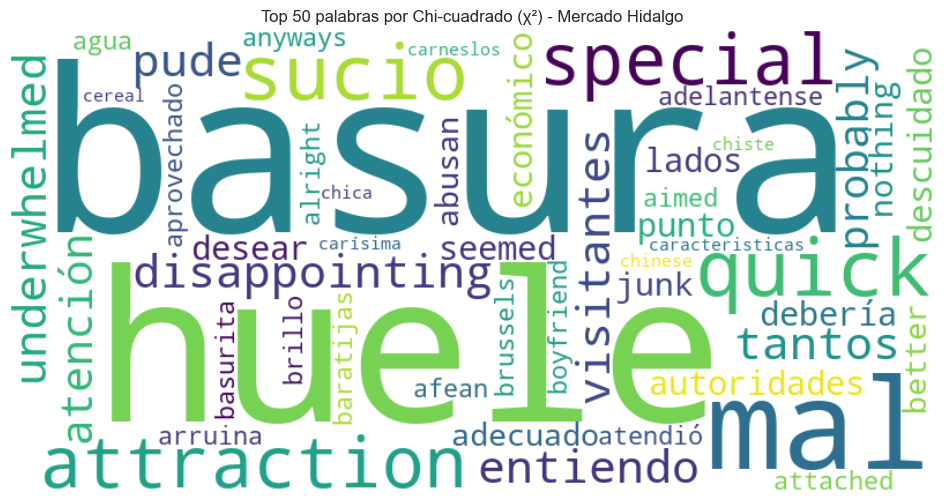

In [26]:
analisis_mercado = AnalisisTextual(df_mercado, nombre_lugar='Mercado Hidalgo')
analisis_mercado.generar_wordcloud_chi2()

## Monumento Pípila

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


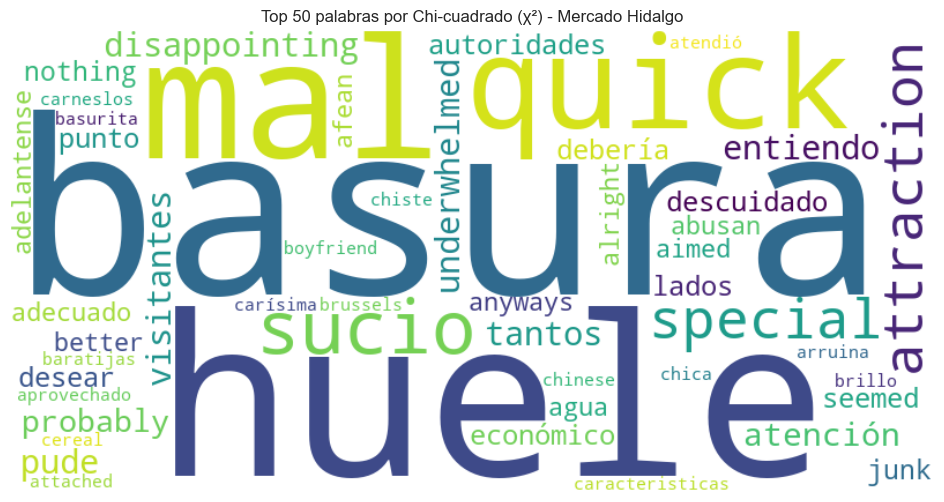

In [27]:
analisis_mercado = AnalisisTextual(df_mercado, nombre_lugar='Mercado Hidalgo')
analisis_mercado.generar_wordcloud_chi2()

## Museo de las Momias

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


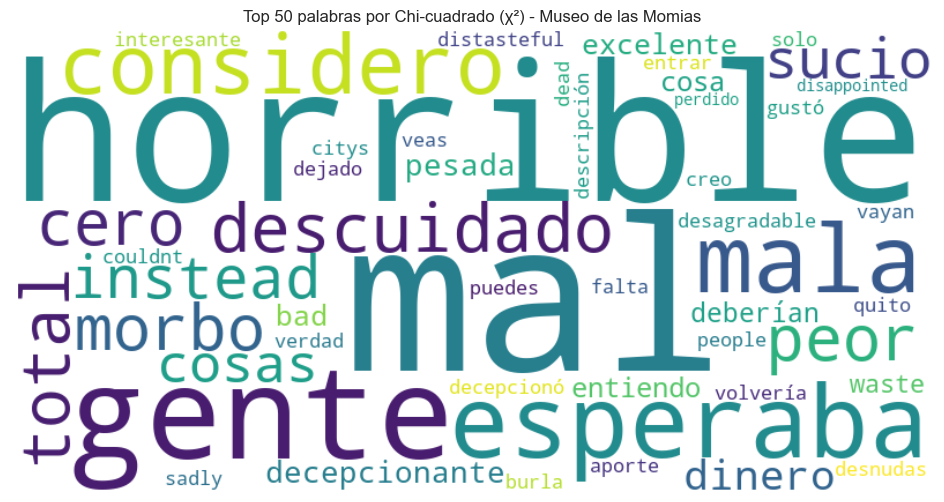

In [28]:
analisis_momias = AnalisisTextual(df_momias, nombre_lugar='Museo de las Momias')
analisis_momias.generar_wordcloud_chi2()

## Teatro Juarez

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


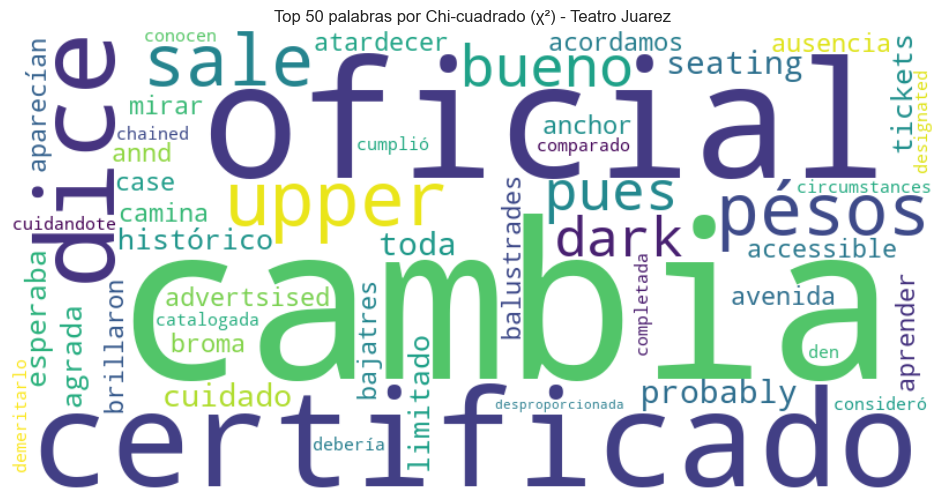

In [29]:
analisis_juarez = AnalisisTextual(df_juarez, nombre_lugar='Teatro Juarez')
analisis_juarez.generar_wordcloud_chi2()

## Universidad de Guanajuato

/Users/andreasolorio/Library/Python/3.9/lib/python/site-packages/sklearn/feature_extraction/text.py:406: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['let'] not in stop_words.
  warnings.warn(


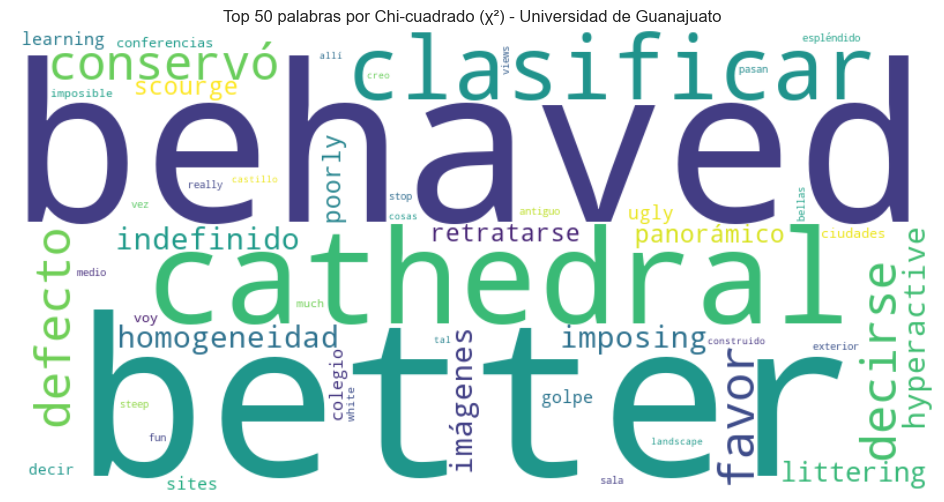

In [30]:
analisis_ug = AnalisisTextual(df_ug, nombre_lugar='Universidad de Guanajuato')
analisis_ug.generar_wordcloud_chi2()

# 3.
Para cada uno de los 10 sitios turísticos, haga un descubrimiento automático de los 3 tópicos con LSA (investiga, estudia y aprende por su cuenta LSA) más relevantes y 10 palabras contenidas en cada tópico de cada uno de los siguientes subgrupos:
- Hombres
- Mujeres
- Turistas Nacionales
- Turistas Internacionales
- Jovénes
- Mayores

Antes de aplicar LSA, asegúrese de hacerlo sobre una matriz lo más grande posible (para su hardware) de TFIDF Normalizada a L2. Note que para cada sitio turístico deberá saber cuales son los 3 temas de interés y sus palabras, para cada uno de estos subgrupos. Recomiendo Gensim; para rápido y fácil. Otra sugerencia puede ser usar la función TruncatedSVD de sklearnt para obtener la descomposición de matrices como se sugiere en el siguiente video para implementar LSA:
https://www.youtube.com/watch?v=hB51kkus-Rc. También podría llevar a cabo svd con numpy (si te sobra tiempo en la vida).

In [ ]:
from nltk.tokenize import word_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from gensim import corpora, models
import pandas as pd

class LSAExtractor:
    def __init__(self, df, columna_texto="Opinión", nombre_lugar="Sitio",filtros=None):
        self.df = df
        self.columna_texto = columna_texto
        self.nombre_lugar = nombre_lugar
        self.stopwords_total = self._cargar_stopwords()
        self.subgrupo_resultados = {}
        
        self.filtros = filtros or [
            ("Género", "Masculino"),
            ("Género", "Femenino"),
            ("Nacional ó Internacional", "Nacional"),
            ("Nacional ó Internacional", "Internacional"),
            ("Edad", "<30"),
            ("Edad", ">=30"),
        ]
    def _cargar_stopwords(self):
        stopwords_es = set(stopwords.words('spanish'))
        stopwords_en = set(stopwords.words('english'))
        return STOPWORDS.union(stopwords_es).union(stopwords_en)

    def _limpiar_texto(self, texto):
        texto = texto.lower()
        texto = re.sub(r'\d+', '', texto)
        texto = re.sub(r'[^\w\s]', '', texto)
        tokens = word_tokenize(texto)
        tokens = [t for t in tokens if t not in self.stopwords_total and len(t) > 2]
        return " ".join(tokens)

    def _filtrar_subgrupo(self, col, val):
        if col == "Edad":
            if val == "<30":
                return self.df[self.df["Edad"] < 30], "Jóvenes"
            elif val == ">=30":
                return self.df[self.df["Edad"] >= 30], "Mayores"
        else:
            sub_df = self.df[self.df[col].str.lower() == val.lower()]
            return sub_df, f"{col}: {val}"

    def _aplicar_lsa(self, textos, num_topics=3, num_words=10):
        textos_limpios = [self._limpiar_texto(text) for text in textos]
        tokenized_texts = [word_tokenize(doc) for doc in textos_limpios]
        dictionary = corpora.Dictionary(tokenized_texts)
        corpus = [dictionary.doc2bow(text) for text in tokenized_texts]

        tfidf_model = models.TfidfModel(corpus)
        corpus_tfidf = tfidf_model[corpus]

        lsa_model = models.LsiModel(corpus_tfidf, id2word=dictionary, num_topics=num_topics)

        top_words = {}
        for topic_id, topic_terms in lsa_model.show_topics(num_topics=num_topics, num_words=num_words, formatted=False):
            top_words[f"Tópico {topic_id+1}"] = [word for word, weight in topic_terms]

        return top_words

    def extraer_topicos_por_filtros(self, min_texts=5):
        print(f"\n {self.nombre_lugar}")
        for col, val in self.filtros:
            sub_df, sub_label = self._filtrar_subgrupo(col, val)

            textos = sub_df[self.columna_texto].dropna().tolist()
            if len(textos) < min_texts:
                print(f"🔹 {sub_label}: No hay suficientes opiniones ({len(textos)}).")
                continue

            topicos = self._aplicar_lsa(textos)

            self.subgrupo_resultados[sub_label] = topicos

        
    import seaborn as sns
    import matplotlib.pyplot as plt

    def visualizar_tabla_topicos(self, num_palabras=10):

        data = {}
        for subgrupo, topicos in self.subgrupo_resultados.items():
            fila = {}
            for topico, palabras in topicos.items():
                mitad = num_palabras // 2
                linea1 = ", ".join(palabras[:mitad])
                linea2 = ", ".join(palabras[mitad:num_palabras])
                fila[topico] = f"{linea1}\n{linea2}"

            data[subgrupo] = fila

        df_tabla = pd.DataFrame.from_dict(data, orient='index').fillna("—")
        n_rows, n_cols = df_tabla.shape
        fig_width = max(12, n_cols * 4)
        fig_height = max(6, n_rows * 1.5)
        plt.figure(figsize=(fig_width, fig_height))
        sns.heatmap(
            df_tabla.applymap(lambda x: len(x)),  #
            annot=df_tabla, fmt='', cmap="RdPu", cbar=False, linewidths=0.5,
            annot_kws={"fontsize": 9, "rotation": 0}, 
            linecolor='white'
        )
        plt.title(f"Tópicos por Subgrupo – {self.nombre_lugar}")
        plt.xlabel("Tópico")
        plt.ylabel("Subgrupo")
        plt.xticks(fontsize=12)
        plt.yticks(fontsize=12)
        plt.tight_layout()
        plt.show()

    def mostrar_estadisticas_subgrupo(self, columna_filtro, valor_filtro):
        if columna_filtro == "Edad":
            if valor_filtro == "<30":
                sub_df = self.df[self.df["Edad"] < 30]
                sub_label = "Jóvenes"
            elif valor_filtro == ">=30":
                sub_df = self.df[self.df["Edad"] >= 30]
                sub_label = "Mayores"
            else:
                print(" Filtro de edad no reconocido.")
            return
        else:
            sub_df = self.df[self.df[columna_filtro].str.lower() == valor_filtro.lower()]
            sub_label = f"{columna_filtro}: {valor_filtro}"

        if sub_df.empty:
            print(f"No hay datos para el subgrupo {sub_label}")
            return

        print(f" Estadísticas para: {sub_label}")
        print(f"Total de opiniones: {len(sub_df)}")
        print(f"Edad promedio: {sub_df['Edad'].mean():.2f} años")
        print("\nDistribución de Calificaciones:")
        print(sub_df['Calificación'].value_counts())

        if 'Tipo_score' in sub_df.columns:
            print("\nTipo de opiniones:")
            print(sub_df['Tipo_score'].value_counts())


## Alhóndiga


 Alhóndiga


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


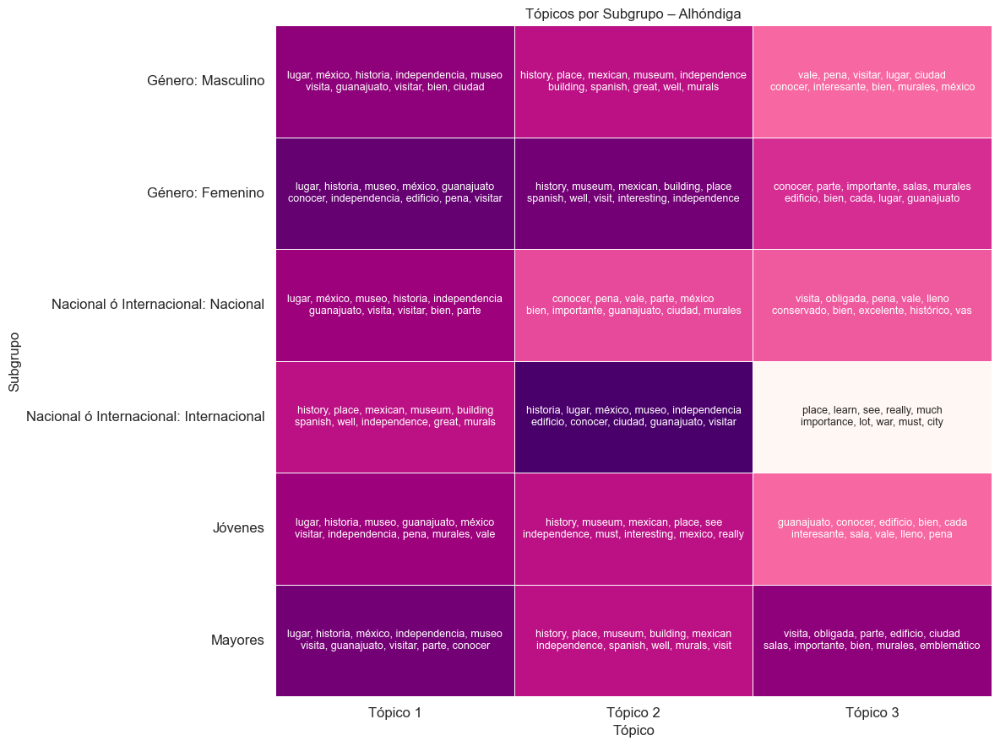

In [81]:
lsa_alhondiga = LSAExtractor(df_alhondiga, nombre_lugar="Alhóndiga")
lsa_alhondiga.extraer_topicos_por_filtros()
lsa_alhondiga.visualizar_tabla_topicos()

## Basilica Colegiata


 Basilica Colegiata


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


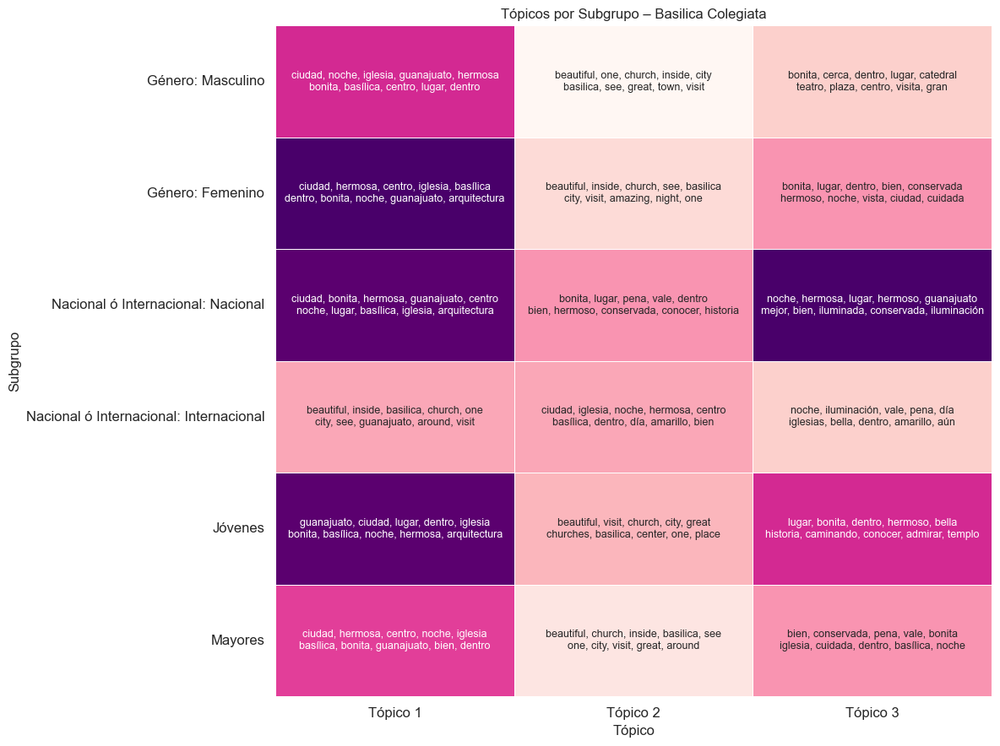

In [82]:
lsa_basilica = LSAExtractor(df_basilica, nombre_lugar="Basilica Colegiata")
lsa_basilica.extraer_topicos_por_filtros()
lsa_basilica.visualizar_tabla_topicos()

## Callejón del Beso


 Callejón del Beso


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


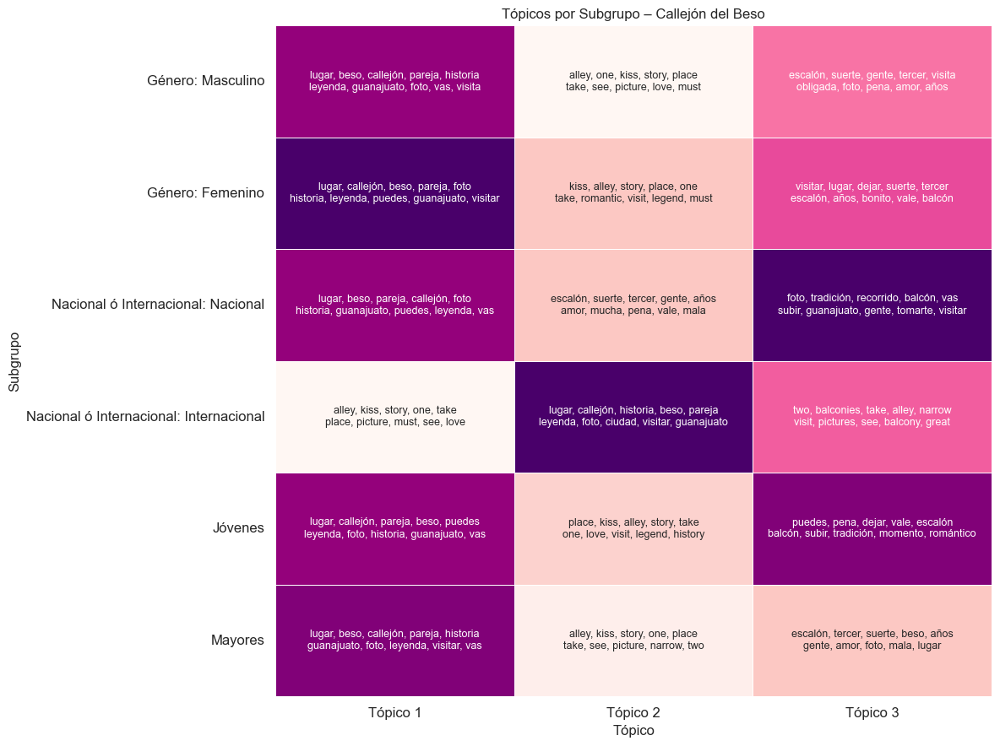

In [83]:
lsa_callejondelbeso = LSAExtractor(df_callejondelbeso, nombre_lugar="Callejón del Beso")
lsa_callejondelbeso.extraer_topicos_por_filtros()
lsa_callejondelbeso.visualizar_tabla_topicos()

## Casa de Diego Rivera


 Casa de Diego Rivera


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


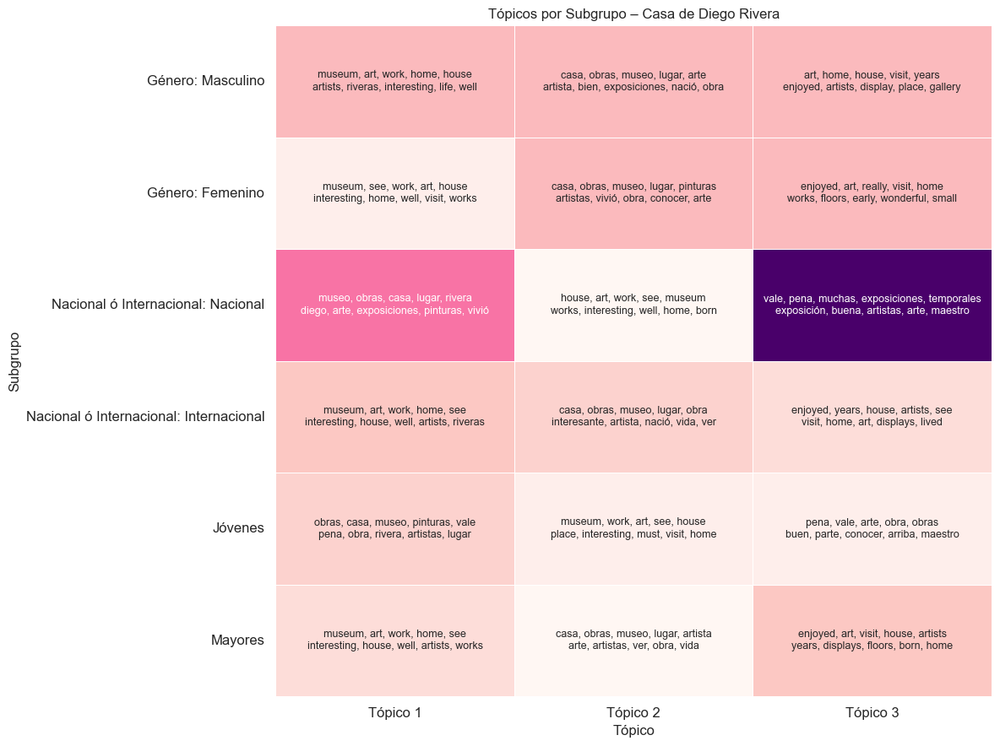

In [84]:
lsa_diegoR = LSAExtractor(df_diegoR, nombre_lugar="Casa de Diego Rivera")
lsa_diegoR.extraer_topicos_por_filtros()
lsa_diegoR.visualizar_tabla_topicos()

## Jardín de la Unión


 Jardín de la Unión


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


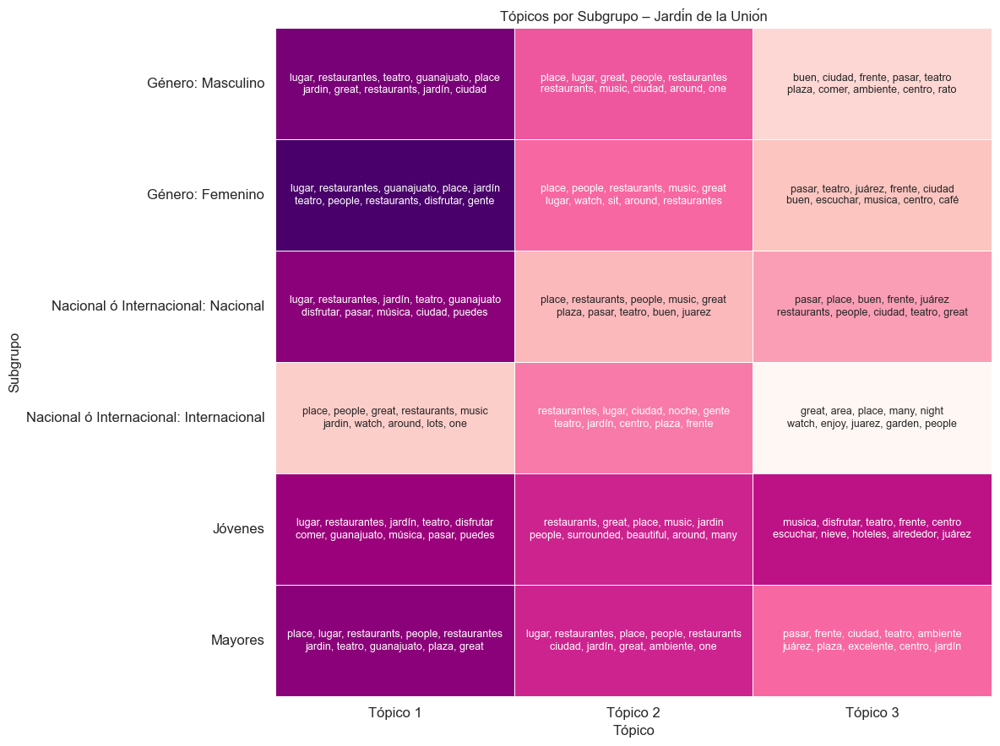

In [85]:
lsa_jardinU = LSAExtractor(df_jardinU, nombre_lugar="Jardín de la Unión")
lsa_jardinU.extraer_topicos_por_filtros()
lsa_jardinU.visualizar_tabla_topicos()

## Mercado Hidalgo


 Mercado Hidalgo


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


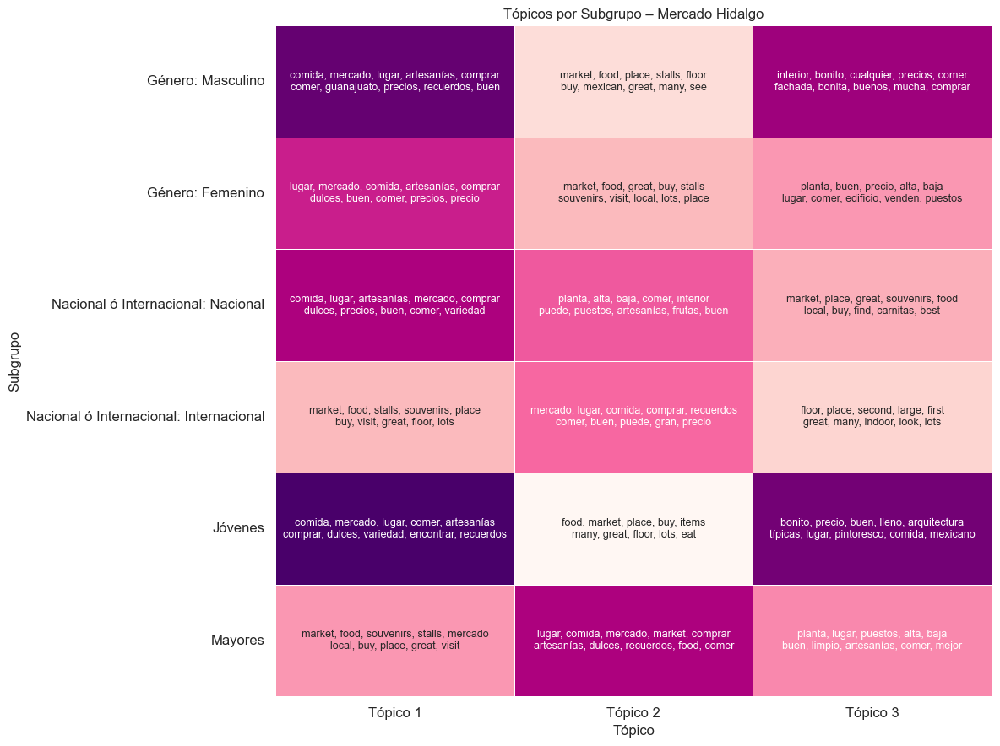

In [86]:
lsa_mercado = LSAExtractor(df_mercado, nombre_lugar="Mercado Hidalgo")
lsa_mercado.extraer_topicos_por_filtros()
lsa_mercado.visualizar_tabla_topicos()

## Monumento Pípila


 Monumento Pípila


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


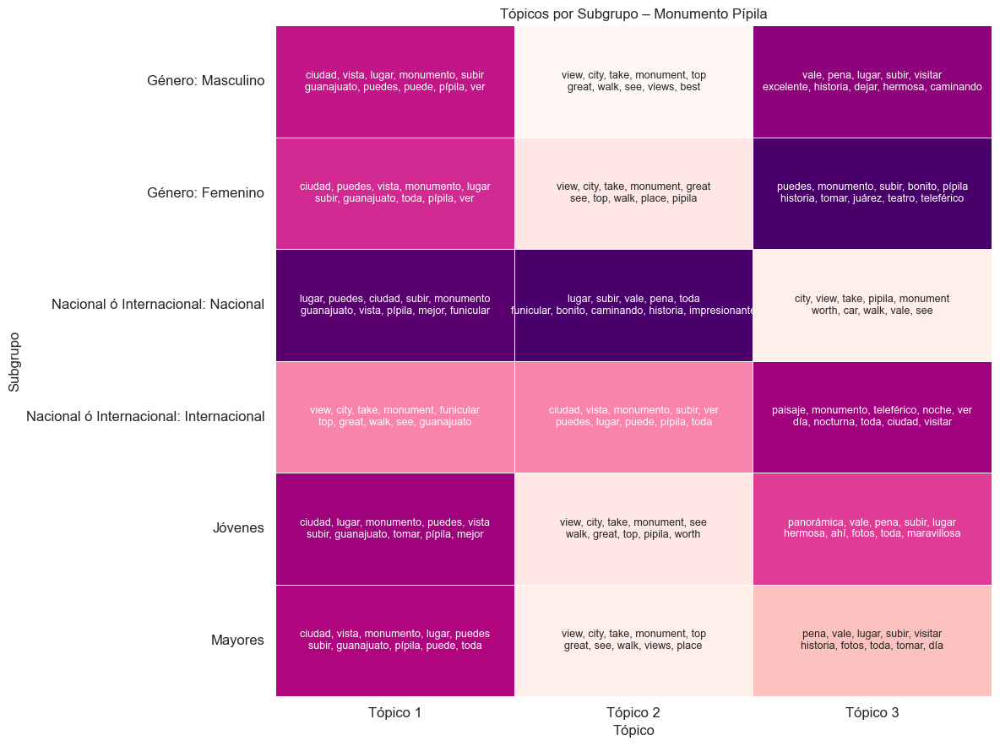

In [87]:
lsa_pipila = LSAExtractor(df_pipila, nombre_lugar="Monumento Pípila")
lsa_pipila.extraer_topicos_por_filtros()
lsa_pipila.visualizar_tabla_topicos()

## Museo de las Momias


 Museo de las Momias


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


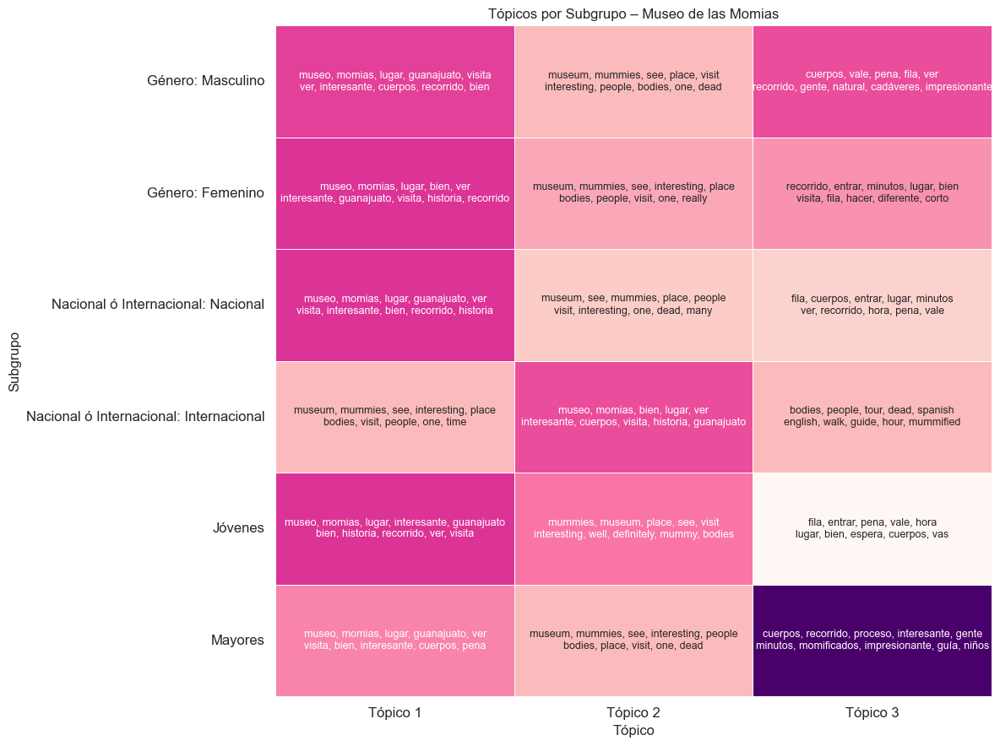

In [88]:
lsa_momias = LSAExtractor(df_momias, nombre_lugar="Museo de las Momias")
lsa_momias.extraer_topicos_por_filtros()
lsa_momias.visualizar_tabla_topicos()

## Teatro Juárez


 Teatro Juárez


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


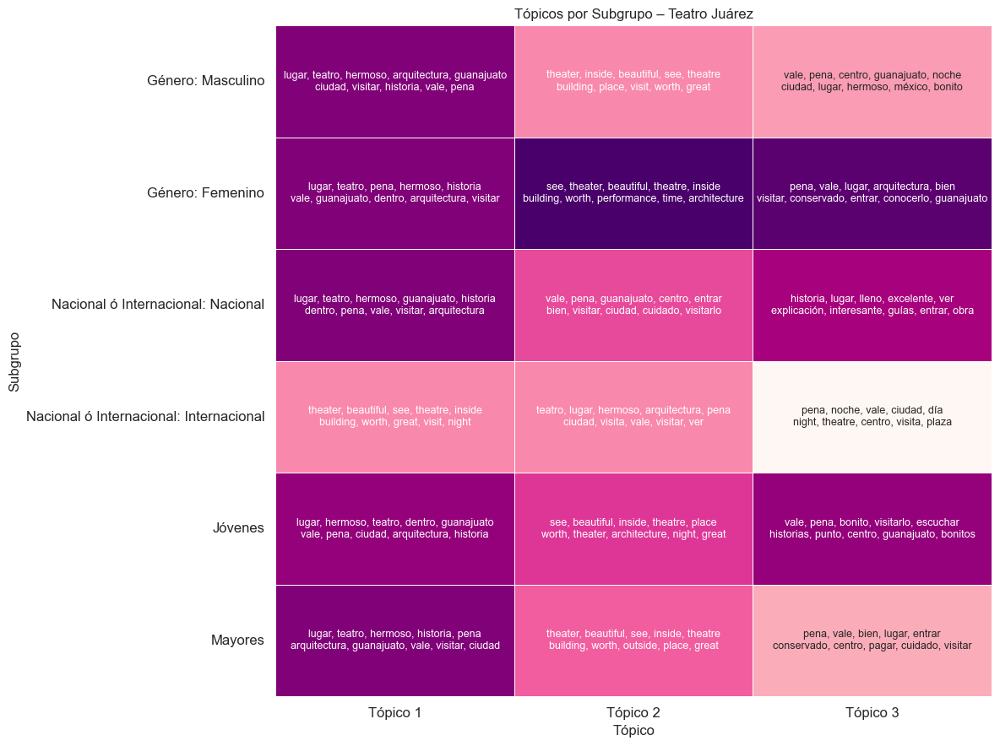

In [89]:
lsa_juarez = LSAExtractor(df_juarez, nombre_lugar="Teatro Juárez")
lsa_juarez.extraer_topicos_por_filtros()
lsa_juarez.visualizar_tabla_topicos()

## Universidad de Guanajuato


 Universidad de Guanajuato


/var/folders/3r/fzd1rrd908j_nt0tr8b5tkfh0000gn/T/ipykernel_70889/3011729304.py:99: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_tabla.applymap(lambda x: len(x)),  #


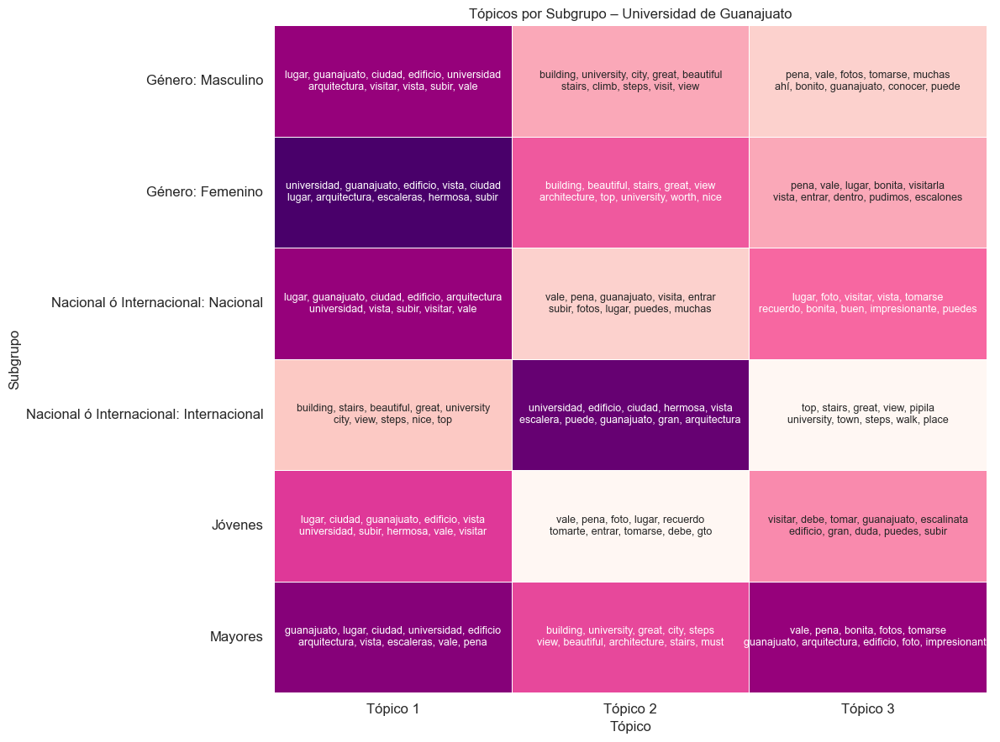

In [90]:
lsa_ug = LSAExtractor(df_ug, nombre_lugar="Universidad de Guanajuato")
lsa_ug.extraer_topicos_por_filtros()
lsa_ug.visualizar_tabla_topicos()

# 4.
Para cada uno de los 10 sitios turísticos construya tres Bolsas de Palabras de la siguiente manera: i) 1000 términos con mayor peso tfidf, ii) 2000 bigramas con mayor tfidf, y iii) 1000 trigramas con mayor tfidf. Luego concatene las tres representaciones que fueron calculadas de forma independiente, con sus propios tfidfs según su espacio y su propio L2. Finalmente sobre todo ese espacio concatenado de 4000 características aplique ganancia de información o X2 y obtenga los 1000 features más relevantes.

Muestre una nube de palabras con el top 50 features relevantes para cada lugar turístico (10 nubes en total, quiero ver, para cada sitio, en la misma nube los mejores uni-bi-trigramas cuando se aplica feature selection en el espacio global).

In [91]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.preprocessing import LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator, TransformerMixin
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from scipy.sparse import hstack
import numpy as np


class FeatureSelectorWithWordcloud:
    def __init__(self, top_k=1000):
        self.top_k = top_k
        self.selector = None
        self.feature_names = []
        
    def _preparar_df(self, df, columna_texto, columna_calificacion):
        df = df.copy()

        if 'Tipo_score' not in df.columns:
            calificacion_map = {
                'Excelente': 5, 'Muy bueno': 4,
                'Regular': 3, 'Malo': 2, 'Pésimo': 1
            }

            def tipo_score(c):
                if c in ['Excelente', 'Muy bueno']:
                    return 'Positivo'
                elif c == 'Regular':
                    return 'Neutro'
                else:
                    return 'Negativo'

            df['Calificación_num'] = df[columna_calificacion].map(calificacion_map)
            df['Tipo_score'] = df[columna_calificacion].apply(tipo_score)

        df = df.dropna(subset=[columna_texto, 'Tipo_score'])
        return df


    def get_tfidf_features(self, texts, ngram_range, max_features):
        vectorizer = TfidfVectorizer(ngram_range=ngram_range, max_features=max_features, norm='l2')
        X = vectorizer.fit_transform(texts)
        return X, vectorizer

    def build_feature_space(self, texts):
        tfidf_uni, vec_uni = self.get_tfidf_features(texts, (1, 1), 1000)
        tfidf_bi, vec_bi = self.get_tfidf_features(texts, (2, 2), 2000)
        tfidf_tri, vec_tri = self.get_tfidf_features(texts, (3, 3), 1000)

        self.feature_names = (
            list(vec_uni.get_feature_names_out()) +
            list(vec_bi.get_feature_names_out()) +
            list(vec_tri.get_feature_names_out())
        )

        return hstack([tfidf_uni, tfidf_bi, tfidf_tri])

    
    def fit_transform(self, df, columna_texto="Opinión", columna_calificacion="Calificación"):
        df_preparado = self._preparar_df(df, columna_texto, columna_calificacion)

        texts = df_preparado[columna_texto].tolist()
        labels = df_preparado["Tipo_score"].tolist()

        X_full = self.build_feature_space(texts)
        y_encoded = LabelEncoder().fit_transform(labels)

        self.selector = SelectKBest(score_func=chi2, k=self.top_k)
        X_selected = self.selector.fit_transform(X_full, y_encoded)

        return X_selected

    def get_top_features(self):
        indices = self.selector.get_support(indices=True)
        return [self.feature_names[i] for i in indices]

    def plot_wordcloud(self, top_n=50, title="Top Features por Chi²"):
        support_indices = self.selector.get_support(indices=True)
        selected_scores = self.selector.scores_[support_indices]
        selected_names = [self.feature_names[i] for i in support_indices]

        features_scores = list(zip(selected_names, selected_scores))
        top_features = sorted(features_scores, key=lambda x: x[1], reverse=True)[:top_n]
        freq_dict = {feat: score for feat, score in top_features}

        wordcloud = WordCloud(width=1000, height=600, background_color='white', colormap='Dark2')
        wordcloud.generate_from_frequencies(freq_dict)

        plt.figure(figsize=(14, 8))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(title, fontsize=18)
        plt.tight_layout()
        plt.show()
        



In [92]:
selector = FeatureSelectorWithWordcloud(top_k=1000)

## Alhóndiga

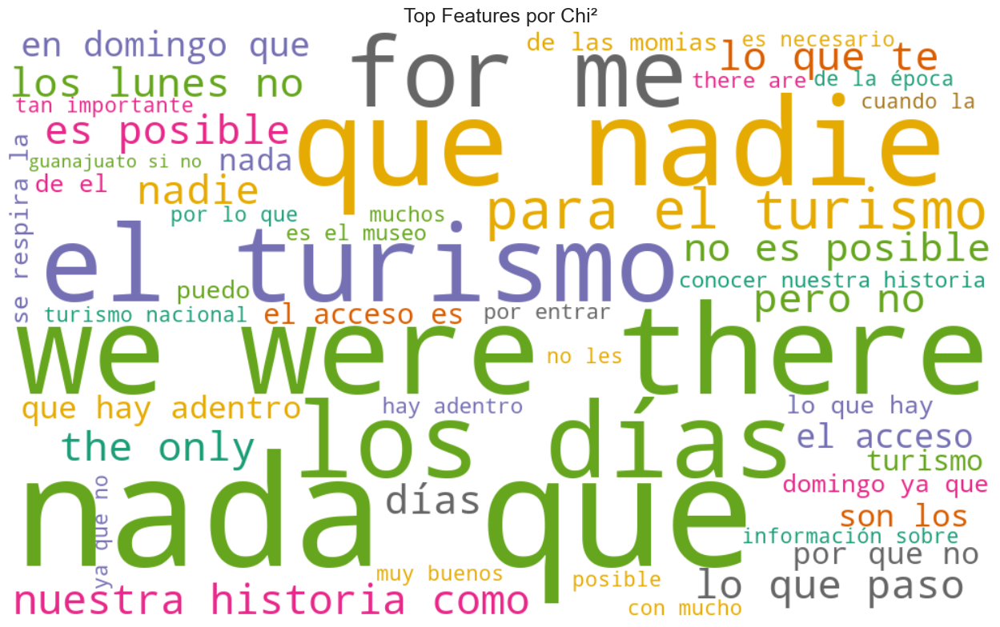

In [93]:
X_final_alhondiga = selector.fit_transform(df_alhondiga)
selector.plot_wordcloud(top_n=50)


## Basilica Colegiata

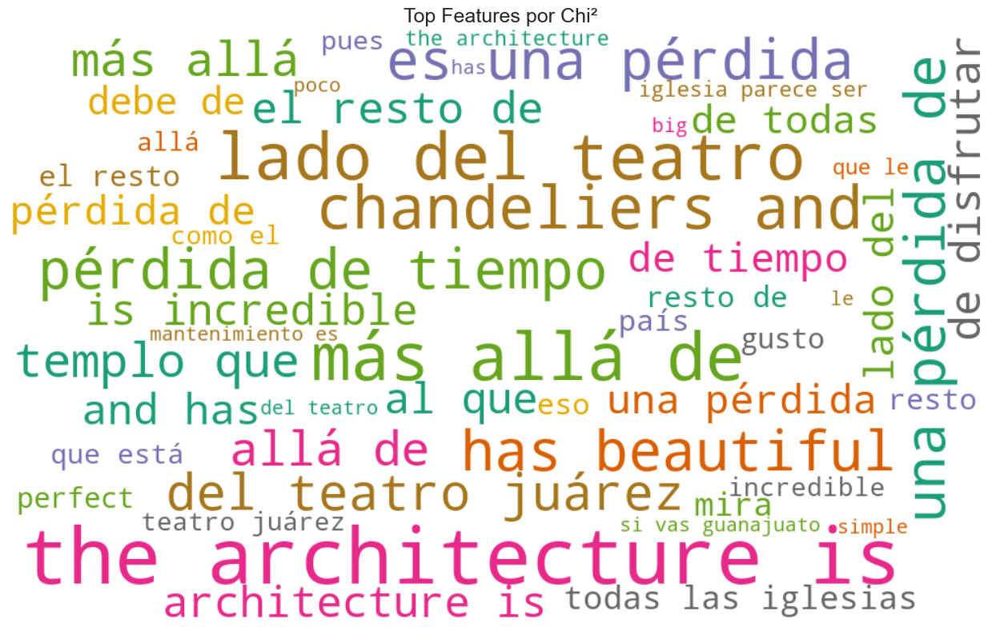

In [94]:
X_final_basilica = selector.fit_transform(df_basilica)
selector.plot_wordcloud(top_n=50)

## Callejón del Beso

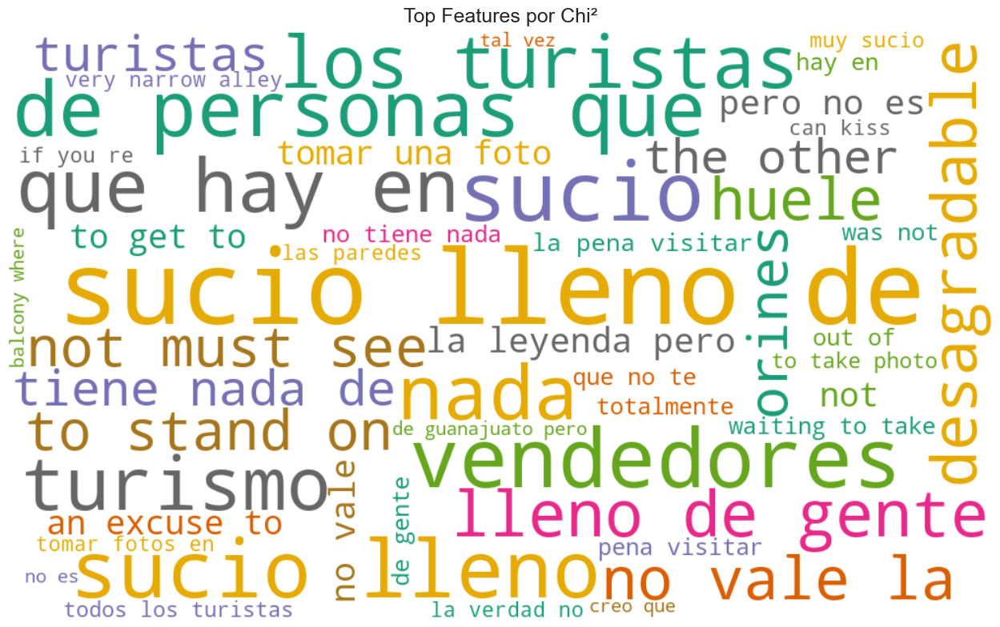

In [95]:
X_final_callejon = selector.fit_transform(df_callejondelbeso)
selector.plot_wordcloud(top_n=50)

## Casa de Diego Rivera

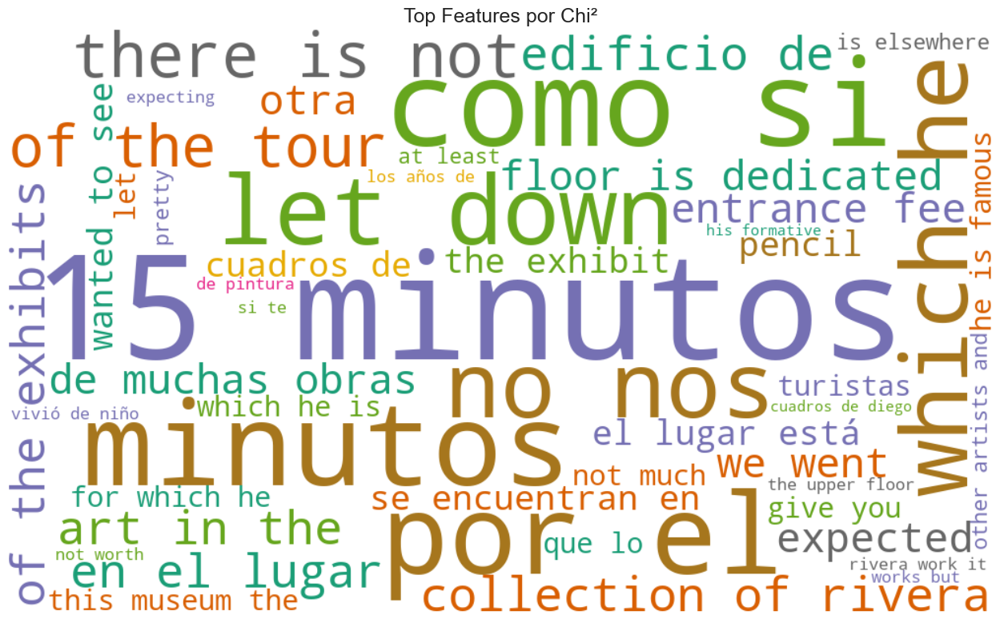

In [96]:
X_final_diegoR = selector.fit_transform(df_diegoR)
selector.plot_wordcloud(top_n=50)

## Jardín de la Unión

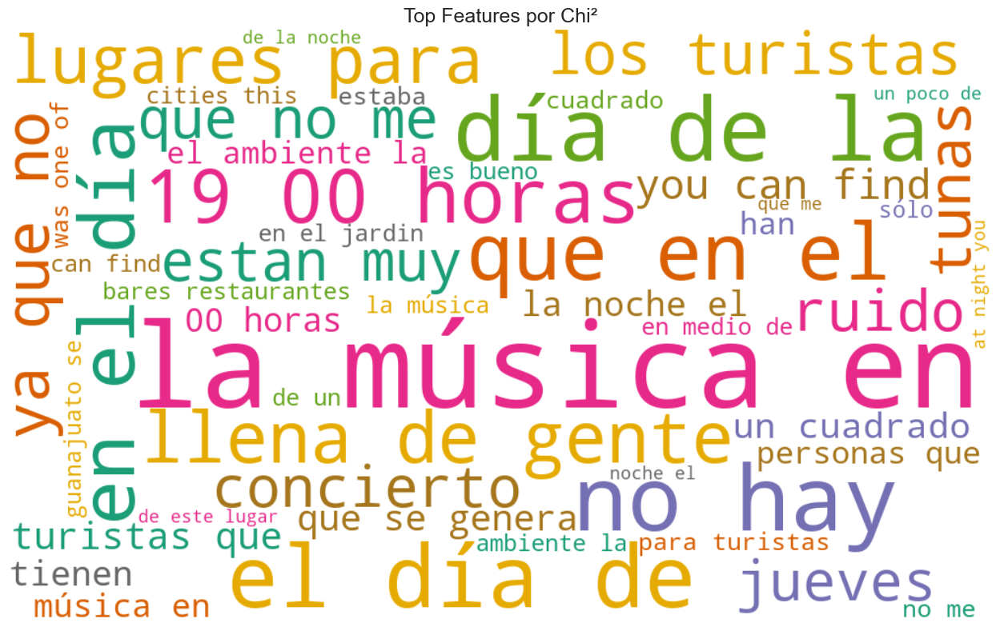

In [97]:
X_final_jardinU = selector.fit_transform(df_jardinU)
selector.plot_wordcloud(top_n=50)

## Mercado Hidalgo

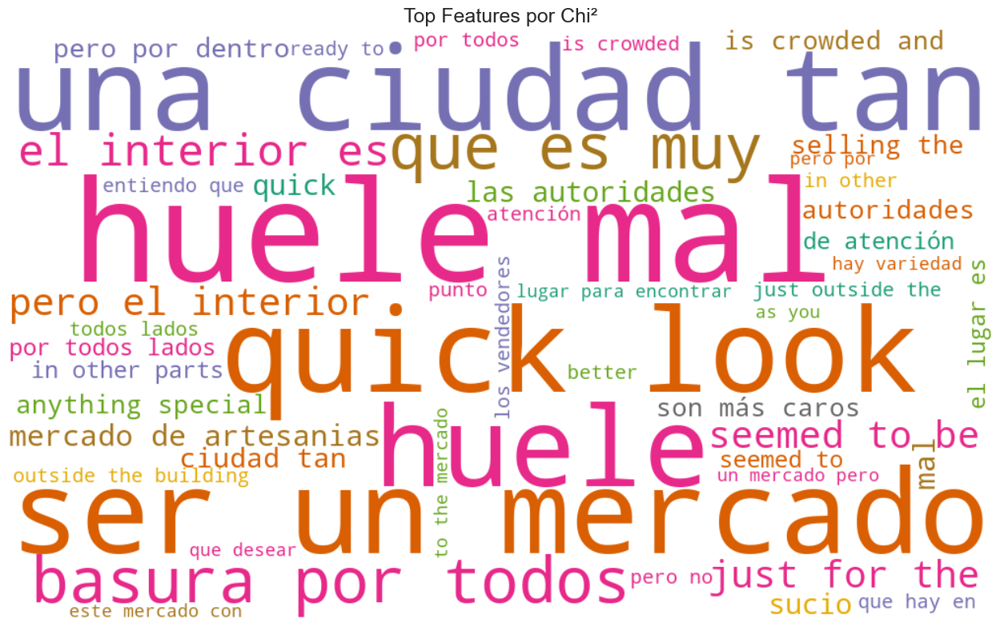

In [98]:
X_final_mercado = selector.fit_transform(df_mercado)
selector.plot_wordcloud(top_n=50)

## Monumento Pípila

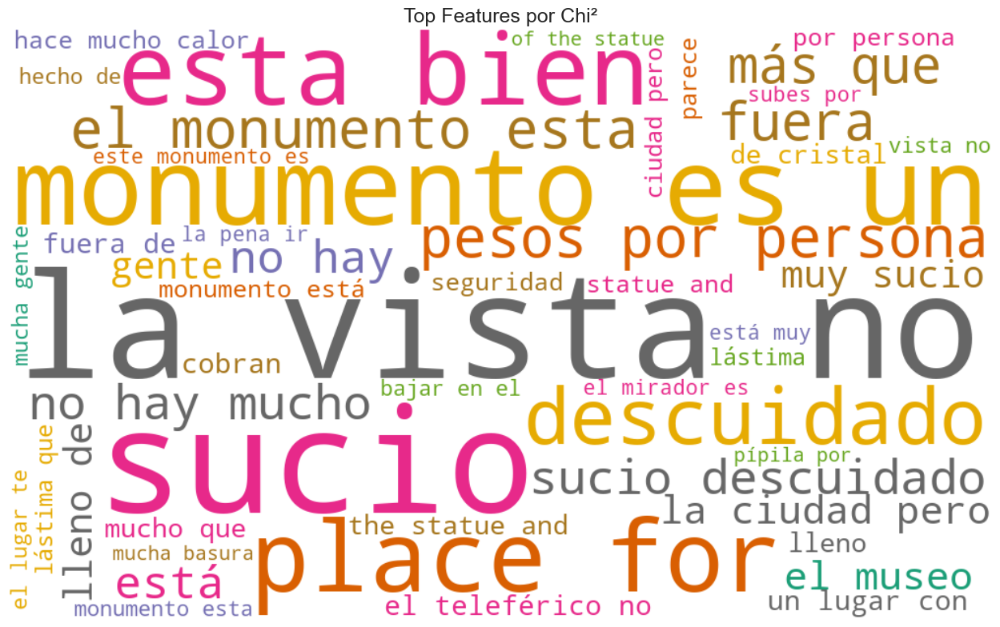

In [99]:
X_final_pipila = selector.fit_transform(df_pipila)
selector.plot_wordcloud(top_n=50)

## Museo de las Momias

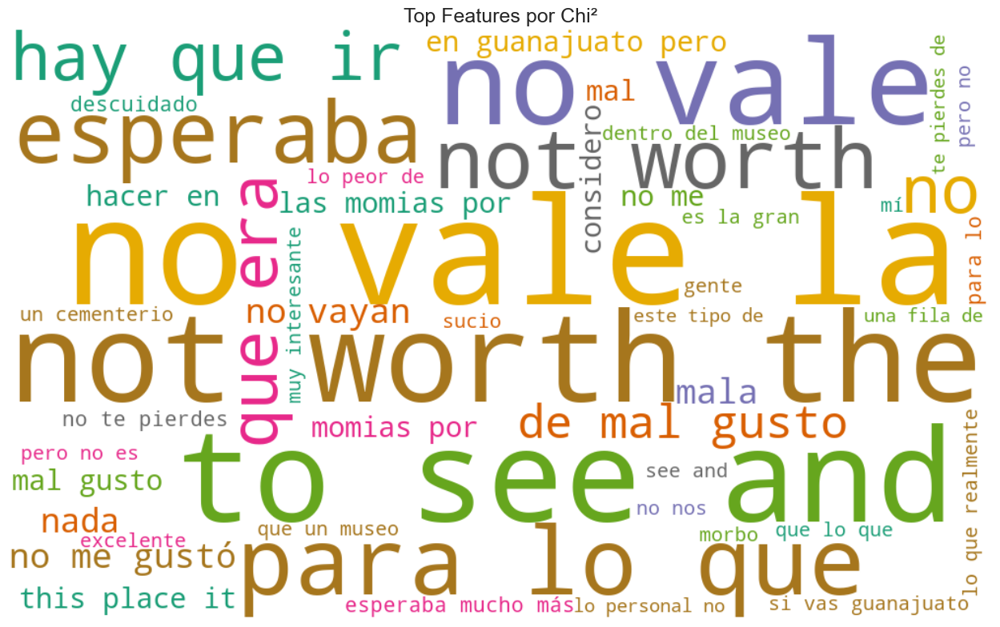

In [100]:
X_final_momias = selector.fit_transform(df_momias)
selector.plot_wordcloud(top_n=50)

## Teatro Juarez

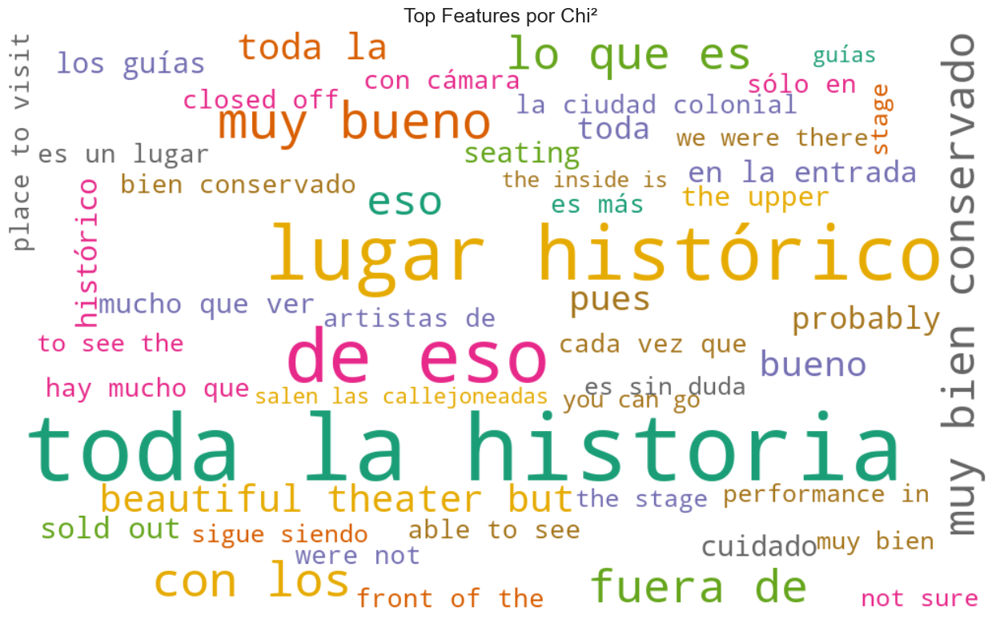

In [101]:
X_final_juarez = selector.fit_transform(df_juarez)
selector.plot_wordcloud(top_n=50)

## Universidad de Guanajuato

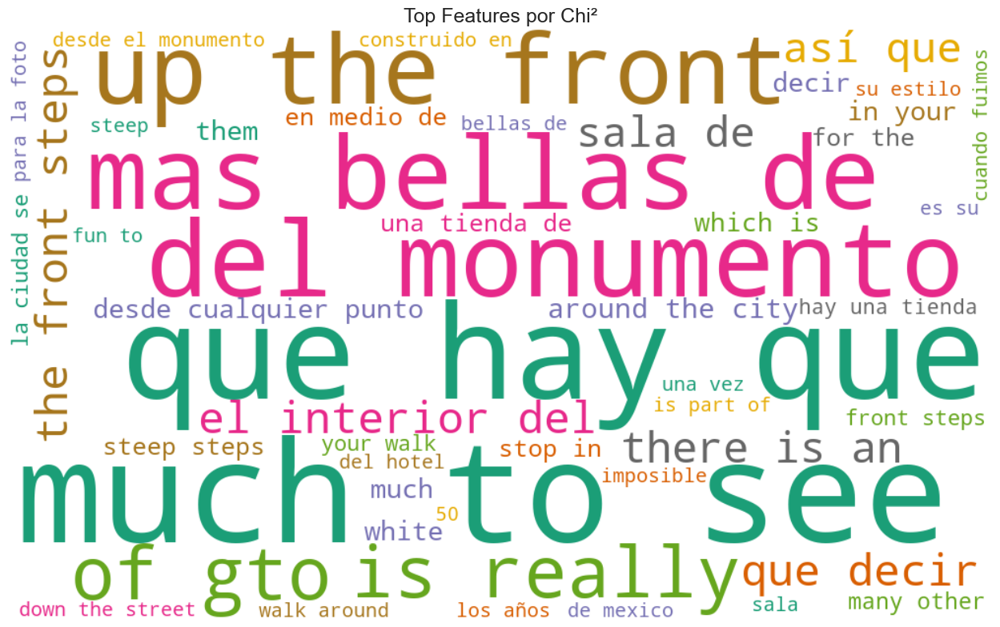

In [102]:
X_final_ug = selector.fit_transform(df_ug)
selector.plot_wordcloud(top_n=50)

# 5. 
Diseñe un análisis temporal (formato libre) que muestre opiniones positivas, negativas y neutras a través de los meses y años para todos los sitios turísticos. En pocas palabras mostrar la evolución de las opiniones a través del tiempo.

In [103]:
class OpinionTimeSeriesVisualizer:
    rosa_palette = {
        "Positivo": "#e91e63",
        "Neutro": "#f48fb1",
        "Negativo": "#ad1457"
    }

    def __init__(self, df, nombre_lugar="Sitio"):
        self.df = df.copy()
        self.nombre_lugar = nombre_lugar
        self._preparar_datos()

    def _preparar_datos(self):
        self.df['Fecha'] = pd.to_datetime(self.df['Fecha'], errors='coerce', dayfirst=True)
        self.df = self.df.dropna(subset=['Fecha', 'Opinión', 'Calificación'])

        if 'Tipo_score' not in self.df.columns:
            def tipo_score(c):
                if c in ['Excelente', 'Muy bueno']:
                    return 'Positivo'
                elif c == 'Regular':
                    return 'Neutro'
                else:
                    return 'Negativo'
            self.df['Tipo_score'] = self.df['Calificación'].apply(tipo_score)

        self.df = self.df.sort_values('Fecha')

    def _agrupar_opiniones(self):
        grouped = self.df.groupby([self.df['Fecha'].dt.to_period('M'), 'Tipo_score']).size().unstack(fill_value=0)
        grouped.index = grouped.index.to_timestamp()
        return grouped

    def graficar_evolucion(self, ventana_media=3):
        df_grouped = self._agrupar_opiniones()

        plt.figure(figsize=(14, 7))
        ax = plt.gca()

        for score_type in df_grouped.columns:
            color = self.rosa_palette.get(score_type, "#ccc")
            ax.plot(df_grouped.index, df_grouped[score_type], label=f"{score_type} (original)", 
                    linewidth=2.5, color=color)


        plt.title(f"Evolución de Opiniones - {self.nombre_lugar}")
        plt.xlabel("Fecha")
        plt.ylabel("Número de Opiniones")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()


## Alhóndiga

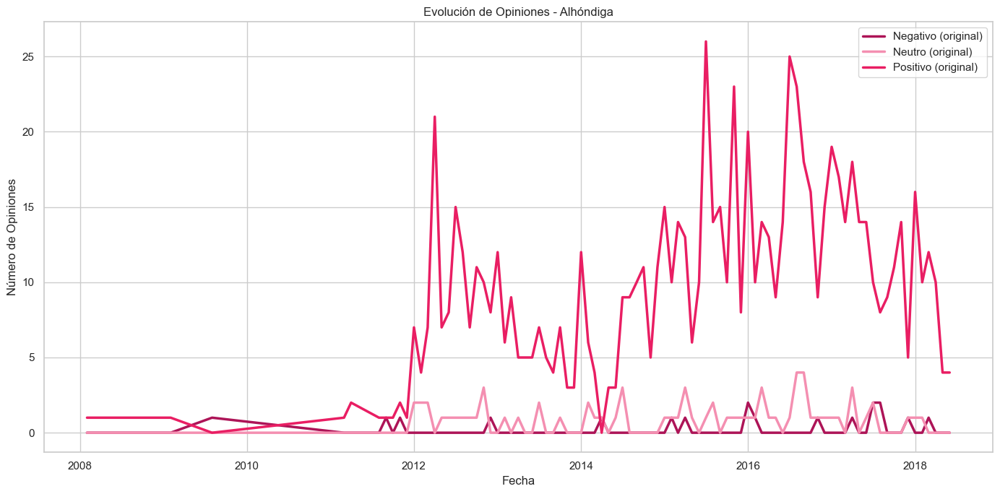

In [104]:
vis_alh = OpinionTimeSeriesVisualizer(df_alhondiga, nombre_lugar="Alhóndiga")
vis_alh.graficar_evolucion()

## Basilica Colegiata

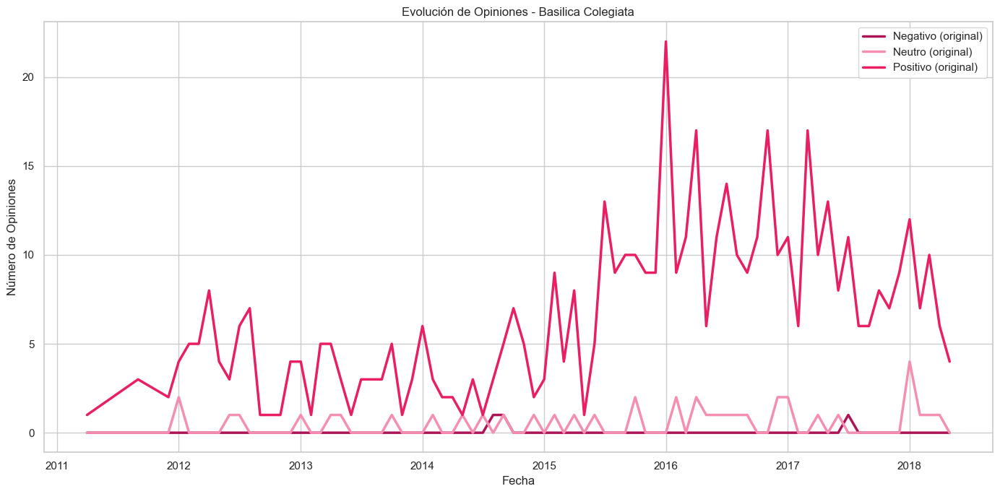

In [105]:
vis_basilica = OpinionTimeSeriesVisualizer(df_basilica, nombre_lugar="Basilica Colegiata")
vis_basilica.graficar_evolucion()

## Callejón del Beso

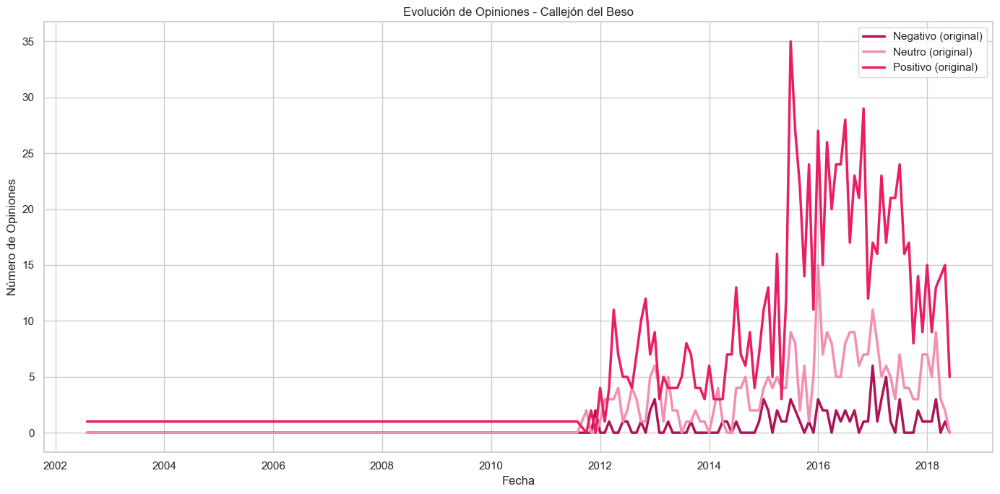

In [106]:
vis_callejondelbeso = OpinionTimeSeriesVisualizer(df_callejondelbeso, nombre_lugar="Callejón del Beso")
vis_callejondelbeso.graficar_evolucion()

## Casa de Diego Rivera

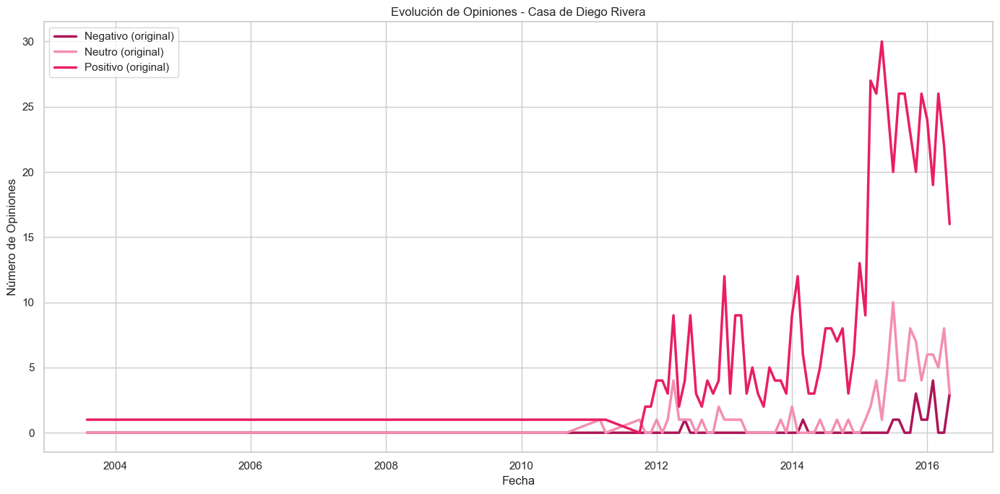

In [107]:
vis_diegoR = OpinionTimeSeriesVisualizer(df_diegoR, nombre_lugar="Casa de Diego Rivera")
vis_diegoR.graficar_evolucion()

## Jardín de la Unión 

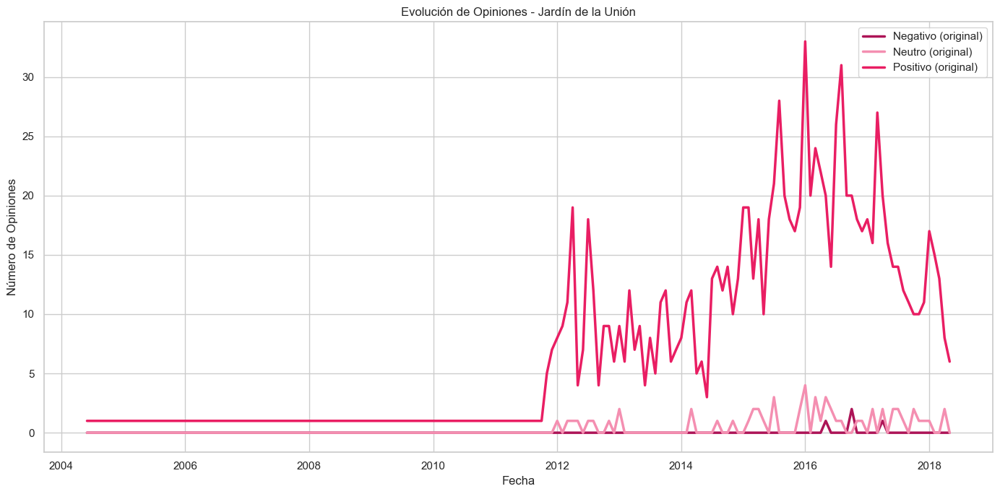

In [108]:
vis_jardinU = OpinionTimeSeriesVisualizer(df_jardinU, nombre_lugar="Jardín de la Unión")
vis_jardinU.graficar_evolucion()

## Mercado Hidalgo

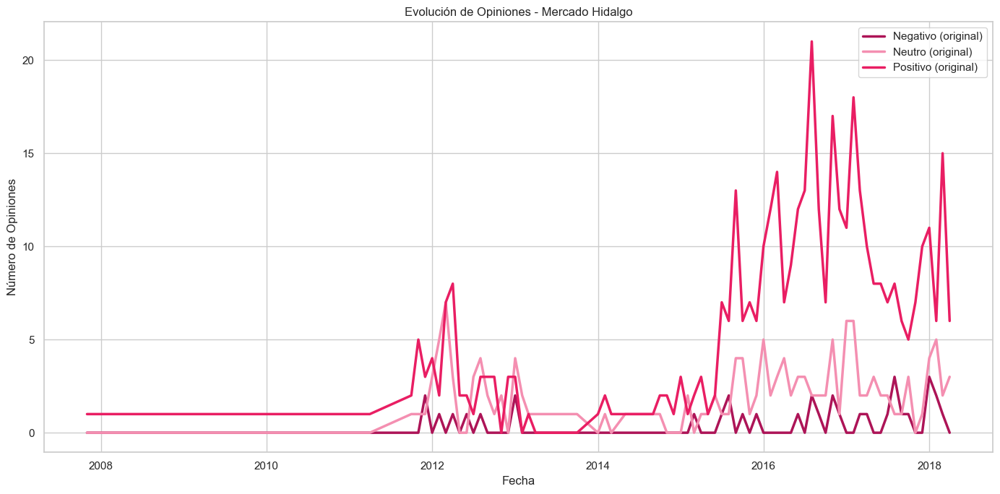

In [109]:
vis_mercado = OpinionTimeSeriesVisualizer(df_mercado, nombre_lugar="Mercado Hidalgo")
vis_mercado.graficar_evolucion()

## Monumento Pípila

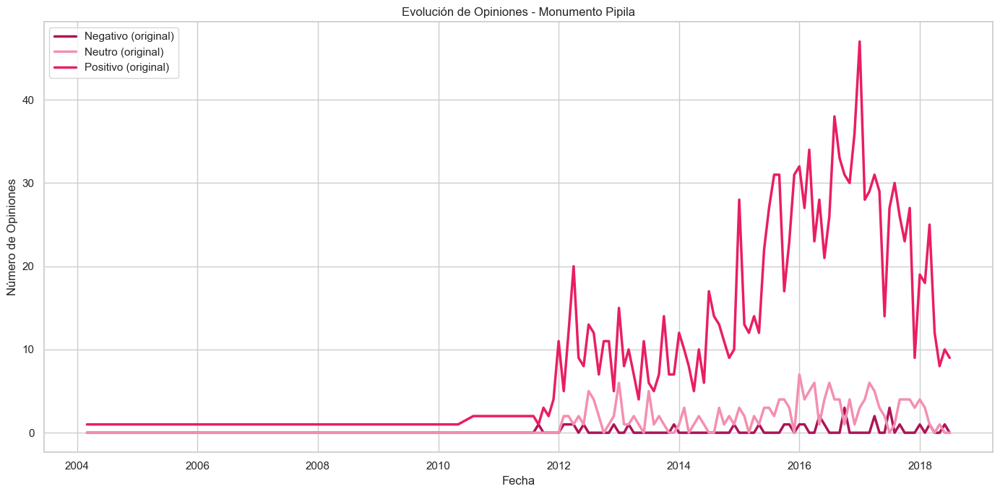

In [110]:
vis_pipila = OpinionTimeSeriesVisualizer(df_pipila, nombre_lugar="Monumento Pipila")
vis_pipila.graficar_evolucion()

## Museo de las Momias

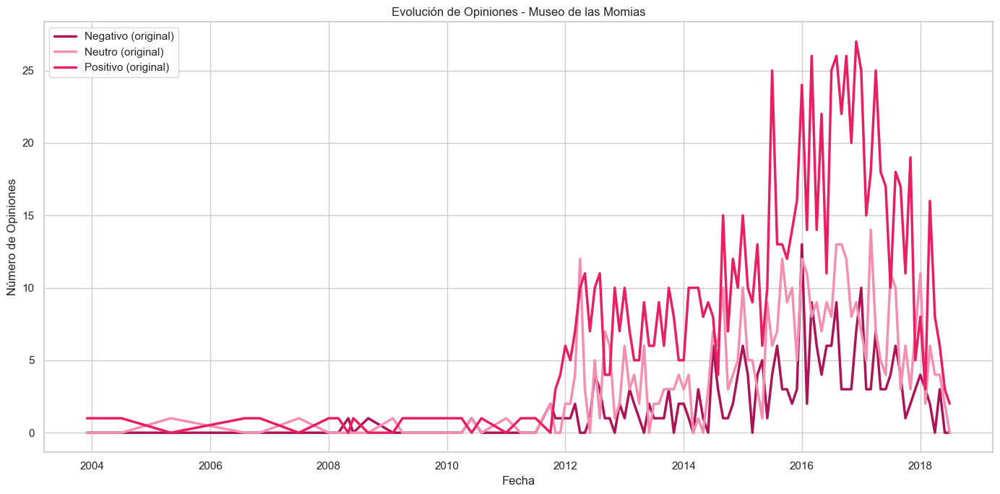

In [111]:
vis_momias = OpinionTimeSeriesVisualizer(df_momias, nombre_lugar="Museo de las Momias")
vis_momias.graficar_evolucion()

## Teatro Juárez

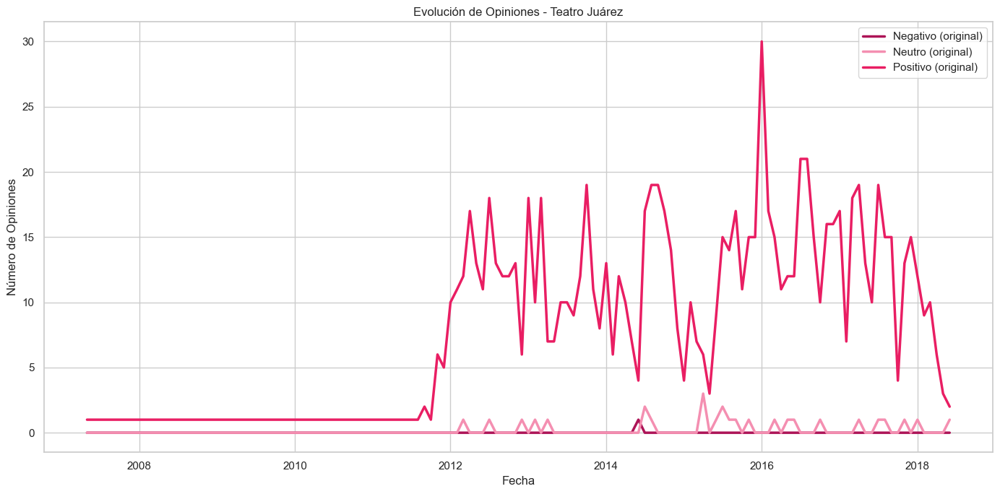

In [112]:
vis_juarez = OpinionTimeSeriesVisualizer(df_juarez, nombre_lugar="Teatro Juárez")
vis_juarez.graficar_evolucion()

## Universidad de Guanajuato

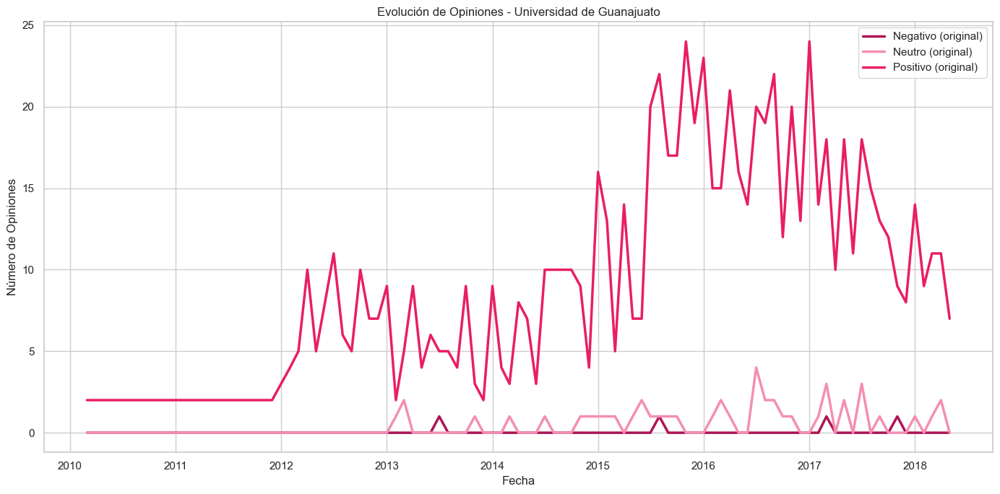

In [113]:
vis_ug = OpinionTimeSeriesVisualizer(df_ug, nombre_lugar="Universidad de Guanajuato")
vis_ug.graficar_evolucion()

# Preguntas.
Conteste lo más detallado posible lo siguiente, dando argumentos y conclusiones claras según su análisis previo. Cada respuesta entre 150 (mínimo) y 300 (máximo) palabras.

## 1. 
¿De los sitios turísticos, cual diría usted que es el más polémico y la razón de ello?

A pesar de que ningun lugar tuvo un promedio de calificación "baja", ya que todaspasaban del 3, las wordcloud tenian palabras muy negativas. Para esto, por el análisis temporal a través de los meses, se puede ver que los dos lugares con más controversia son el museo de las momias y el callejón del beso. 
Escogiendo el callejón del beso, en sus wordcloud se puede notar palabras muy buenas como "romantico" pero también palabras malas como "sucio" o "orines". Más aún, cuando se han juntado los diferentes modelos, se puede ver repetida la palabra "sucio" junto con algunas palabras, hay muy pocas palabras positivas y su promedio de calificaciones es de casi 4, lo cual es raro ya que deberia tener palabras con bigramas más positivos.

## 2. 
En cuanto al sitio más polémico, ¿Como es la diferencia de opinión y temas entre turistas nacionales e internacionales?

Comenzando que son más visitantes Nacionales que Internacionales, se puede ver al analizar los tópicos que ambos lo ven como de manera "buena", i.e, se estan viendo las palabras más "comunes" por así decirlo y el primero que tiene una palabra "mala" es un visitante nacional, siendo nacional o internacional se representan con palabras muy similares como "beso", "balcon", "callejón", etc.

## 3. 
¿Cual diría que es el sitio que le gusta más a las mujeres y por qué?


El callejón del beso, ya que todos sus comentarios dentro de los topicos son positivos, como ya se habia comentado se tratan de los tokens más comunes y estos tokens son positivos además de que con LSA se llega a saber las calificaciones promediio del subgrupo en especifico de mukeres, teniendo más de la mitad calificaciones de 4 o 5.

### Alhóndiga

In [117]:
lsa_alhondiga.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 417
Edad promedio: 38.78 años

Distribución de Calificaciones:
Calificación
Excelente    242
Muy bueno    129
Regular       36
Malo           9
Pésimo         1
Name: count, dtype: int64


### Basilica Colegiata

In [118]:
lsa_basilica.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 243
Edad promedio: 40.87 años

Distribución de Calificaciones:
Calificación
Excelente    157
Muy bueno     71
Regular       14
Pésimo         1
Name: count, dtype: int64


### Callejón del Beso

In [119]:
lsa_callejondelbeso.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 682
Edad promedio: 36.54 años

Distribución de Calificaciones:
Calificación
Excelente    256
Muy bueno    248
Regular      140
Malo          24
Pésimo        14
Name: count, dtype: int64


### Casa de Diego Rivera

In [120]:
lsa_diegoR.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 349
Edad promedio: 43.23 años

Distribución de Calificaciones:
Calificación
Excelente    154
Muy bueno    140
Regular       45
Malo           7
Pésimo         3
Name: count, dtype: int64


### Jardín de la Unión

In [121]:
lsa_jardinU.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 510
Edad promedio: 39.93 años

Distribución de Calificaciones:
Calificación
Excelente    347
Muy bueno    135
Regular       25
Malo           3
Name: count, dtype: int64


### Mercado Hidalgo

In [122]:
lsa_mercado.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 272
Edad promedio: 37.70 años

Distribución de Calificaciones:
Calificación
Muy bueno    106
Excelente     95
Regular       56
Malo          10
Pésimo         5
Name: count, dtype: int64


### Pipila

In [123]:
lsa_pipila.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 743
Edad promedio: 36.90 años

Distribución de Calificaciones:
Calificación
Excelente    417
Muy bueno    240
Regular       75
Malo           8
Pésimo         3
Name: count, dtype: int64


### Museo de las Momias

In [124]:
lsa_momias.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 779
Edad promedio: 36.80 años

Distribución de Calificaciones:
Calificación
Excelente    230
Muy bueno    228
Regular      212
Malo          64
Pésimo        45
Name: count, dtype: int64


### Teatro Juárez

In [125]:
lsa_juarez.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 456
Edad promedio: 39.44 años

Distribución de Calificaciones:
Calificación
Excelente    344
Muy bueno    102
Regular       10
Name: count, dtype: int64


### Universidad de Guanajuato

In [126]:
lsa_ug.mostrar_estadisticas_subgrupo("Género", "Femenino")

 Estadísticas para: Género: Femenino
Total de opiniones: 416
Edad promedio: 38.14 años

Distribución de Calificaciones:
Calificación
Excelente    285
Muy bueno    111
Regular       20
Name: count, dtype: int64


## 4. 
¿Cual diría que es el sitio que le gusta más a las personas jóvenes y por qué?

Primero se puede notar dadas la primeras estadisticas de que la mayoria de personas no son jovenes, aqui se tomaron personas jovenes a menores de 30, la mayoria son mayores de 30. Dada la colorimetria de los tópicos sacados, mientra más intenso son más las coincidencias y dicho eso el que "más" les gusta es el teatro Juárez, resltando su arquitectura y hermosura.

## 5.
¿Qué otras observaciones valiosas puede obtener de su análisis? (e.g., ¿identificó de que se queja la gente? ¿qué tipo de cosas le gustó a la gente?, etc.)

Mencionan mucho la suciedad y mal olor de los callejones, así como que las momias no es un lugar muy agradable para ellos, mencionan lugares llenos y con muchos vendedores. Asi como palabras tipo: desagradables, que no vale la pena. Del lugar que mejores comentarios y palabra tiene es el teatro Juarés, los demás lugares tienen más comentarios negativos que positivos.